In [1]:
# Pin here for fix of CPU offloading bug;implemented in docker /uv
#%pip install "transformers==4.57.3" "accelerate==1.12.0" "bitsandbytes==0.49.1" "vllm<0.22.0"
#%pip install matplotlib seaborn h5py
#%pip install datasets

In [2]:
from experiments_vllm import *
from data import *
from config_synthetic_workloads import *
import pickle

In [3]:
# Environment fixes
import os
os.environ["FLASHINFER_DISABLE_VERSION_CHECK"] = "1"

import sys, os
venv_bin = os.path.dirname(sys.executable)
if venv_bin not in os.environ["PATH"].split(os.pathsep):
    os.environ["PATH"] = venv_bin + os.pathsep + os.environ["PATH"]

In [4]:
# Set seeds
seed = 43
torch.manual_seed(seed);

In [5]:
# Get test data: prompts from synthetic workloads
with open(workloads_file, 'rb') as file:
    workloads = pickle.load(file)
workload_lengths = list(workloads.keys())
workload_alphas = list(workloads[workload_lengths[0]].keys())
workload_length = workload_lengths[0]
workload_prompts = {alpha:workloads[workload_length][alpha]['prompts_formatted'] for alpha in workload_alphas}
print(workload_alphas)
print(workload_length)

[0.2, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.6, 2.0]
149673


In [6]:
# Get model
model, tokenizer = load_model(model_id, enable_bnb=True)
probe = MoEProbeQwen(model)

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

MoEHook: Scanning model for routers...
MoEHook: Attached probes to 24 router layers.
MoEHook: Model has 24 routers each with 60 experts and selects k=4 at each layer.
MoEProbe: Qwen1.5-MoE-A2.7B model also has shared expert with intermediate size: 5632 (Equivalent to ~4 routed experts)


In [7]:
# Make trace directories
trace_paths = {alpha: trace_dir + trace_id + f'_alpha{i}' for i, alpha in enumerate(workload_alphas)}
for t in trace_paths.values():
    if not os.path.isdir(t):
        os.mkdir(t)

In [8]:
# Measure throughput and record traces over workloads
workload_results = {}
for i, alpha in enumerate(workload_alphas):
    trace_id_alpha = trace_id + f'_alpha{i}'
    trace_path = trace_dir + trace_id_alpha
    alpha_results = await measure_vllm_throughput(model_id,
                                                  workload_prompts[alpha],
                                                  seed=seed,
                                                  max_new_tokens=max_new_tokens,
                                                  max_model_len=max_model_len,
                                                  batch_size=batch_size,
                                                  concurrency_limit=batch_size*4,
                                                  gpu_memory_utilization=gpu_memory_utilization,
                                                  n_gpus=n_gpus,
                                                  n_warmup_samples=n_warmup_samples,
                                                  print_output=False,
                                                  enable_expert_parallel=enable_expert_parallel,
                                                  enable_prefix_caching=enable_prefix_caching,
                                                  trace_dir=trace_path)
    workload_results[alpha] = alpha_results

Starting vLLM server for Qwen/Qwen1.5-MoE-A2.7B-Chat...
Waiting for server to initialize ...
WARNING 08-24 11:56:33 [config.py:70] Support for Transformers v4 is deprecated. The Transformers v4 codepath will become unmaintained in vLLM v0.22.0 and will be removed in vLLM v0.24.0. Please upgrade to Transformers v5: pip install --upgrade transformers
WARNING 08-24 11:56:35 [profiler.py:129] Using 'torch' profiler with delay_iterations or max_iterations while ignore_frontend is False may result in high overhead.
(APIServer pid=24677) INFO 08-24 11:56:35 [utils.py:306] 
(APIServer pid=24677) INFO 08-24 11:56:35 [utils.py:306]        █     █     █▄   ▄█
(APIServer pid=24677) INFO 08-24 11:56:35 [utils.py:306]  ▄▄ ▄█ █     █     █ ▀▄▀ █  version 0.21.0
(APIServer pid=24677) INFO 08-24 11:56:35 [utils.py:306]   █▄█▀ █     █     █     █  model   Qwen/Qwen1.5-MoE-A2.7B-Chat
(APIServer pid=24677) INFO 08-24 11:56:35 [utils.py:306]    ▀▀  ▀▀▀▀▀ ▀▀▀▀▀ ▀     ▀
(APIServer pid=24677) INFO 08-24 11:56

(Worker pid=24983) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=24983) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=24988) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=24988) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=24985) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will b

(Worker pid=24983) INFO 08-24 11:57:04 [pynccl.py:111] vLLM is using nccl==2.28.9
(Worker pid=24983) WARNING 08-24 11:57:05 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=24985) WARNING 08-24 11:57:05 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=24984) WARNING 08-24 11:57:05 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=24990) WARNING 08-24 11:57:05 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=24988) WARNING 08-24 11:57:05 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=24989) WARNING 08-24 11:57:05 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=24986) WARNING 08-

Loading safetensors checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading safetensors checkpoint shards:  12% Completed | 1/8 [00:00<00:01,  4.20it/s]
Loading safetensors checkpoint shards:  25% Completed | 2/8 [00:00<00:01,  3.91it/s]
Loading safetensors checkpoint shards:  38% Completed | 3/8 [00:00<00:01,  4.36it/s]
Loading safetensors checkpoint shards:  50% Completed | 4/8 [00:00<00:00,  4.19it/s]
Loading safetensors checkpoint shards:  62% Completed | 5/8 [00:01<00:00,  4.36it/s]
Loading safetensors checkpoint shards:  75% Completed | 6/8 [00:01<00:00,  4.11it/s]
Loading safetensors checkpoint shards:  88% Completed | 7/8 [00:01<00:00,  4.06it/s]
Loading safetensors checkpoint shards: 100% Completed | 8/8 [00:01<00:00,  4.62it/s]
(Worker_TP0_EP0 pid=24983) 


(Worker_TP0_EP0 pid=24983) INFO 08-24 11:57:13 [default_loader.py:397] Loading weights took 1.74 seconds
(Worker_TP0_EP0 pid=24983) INFO 08-24 11:57:13 [unquantized.py:345] Using MoEPrepareAndFinalizeNoDPEPModular
(Worker_TP0_EP0 pid=24983) INFO 08-24 11:57:13 [gpu_model_runner.py:4959] Model loading took 3.55 GiB memory and 6.685153 seconds
(Worker_TP0_EP0 pid=24983) INFO 08-24 11:57:22 [backends.py:1089] Using cache directory: /root/.cache/vllm/torch_compile_cache/05aae7ce90/rank_0_0/backbone for vLLM's torch.compile
(Worker_TP0_EP0 pid=24983) INFO 08-24 11:57:22 [backends.py:1148] Dynamo bytecode transform time: 3.32 s
(Worker_TP7_EP7 pid=24990) INFO 08-24 11:57:23 [decorators.py:311] Directly load AOT compilation from path /root/.cache/vllm/torch_compile_cache/torch_aot_compile/2338a090d9a7737e9707f6b695bcf1ce5a7f632f34c82f62c99591943bc859ba/rank_7_0/model
(Worker_TP0_EP0 pid=24983) INFO 08-24 11:57:23 [backends.py:292] Directly load the compiled graph(s) for compile range (1, 2048

Capturing CUDA graphs (mixed prefill-decode, PIECEWISE): 100%|██████████| 35/35 [00:05<00:00,  6.22it/s]
Capturing CUDA graphs (decode, FULL): 100%|██████████| 19/19 [00:02<00:00,  6.75it/s]


(Worker_TP6_EP6 pid=24989) INFO 08-24 11:57:38 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP7_EP7 pid=24990) INFO 08-24 11:57:39 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP6_EP6 pid=24989) INFO 08-24 11:57:39 [jit_monitor.py:54] Kernel JIT monitor activated — Triton JIT compilations during inference will be logged as warnings.
(Worker_TP1_EP1 pid=24984) INFO 08-24 11:57:39 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP3_EP3 pid=24986) INFO 08-24 11:57:39 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP5_EP5 pid=24988) INFO 08-24 11:57:39 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP0_EP0 pid=24983) I

(APIServer pid=24677) INFO:     Started server process [24677]
(APIServer pid=24677) INFO:     Waiting for application startup.
(APIServer pid=24677) INFO:     Application startup complete.


(APIServer pid=24677) INFO:     127.0.0.1:44222 - "GET /v1/models HTTP/1.1" 200 OK
Server is ready!
Sending batch of 10 concurrent requests...
(APIServer pid=24677) INFO:     127.0.0.1:47638 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47650 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47654 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47658 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47670 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47678 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47694 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47696 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47710 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer 

(APIServer pid=24677) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(APIServer pid=24677)   _warn_once(
ERROR: External init callback must run in same thread as registerClient (-910240064 != -1329387712)


(APIServer pid=24677) INFO:     127.0.0.1:47812 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47822 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47826 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47836 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47844 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47846 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47862 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47866 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47874 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47884 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:47888 - "POST /v1/

(Worker_TP1_EP1 pid=24984) (Worker_TP2_EP2 pid=24985) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
/venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP1_EP1 pid=24984) (Worker_TP2_EP2 pid=24985) (Worker_TP6_EP6 pid=24989)   _warn_once(
  _warn_once(
/venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP6_EP6 pid=24989)   _warn_once(
(Worker_TP7_EP7 pid=24990) (Worker_TP3_EP3 pid=24986) /venv/m

(Worker_TP0_EP0 pid=24983) INFO 08-24 11:58:15 [wrapper.py:96] Starting profiler after delay...
(APIServer pid=24677) INFO:     127.0.0.1:51284 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:51288 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:51298 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:51300 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:51316 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:51324 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:51340 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:51342 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:51352 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=24677) INFO:     127.0.0.1:51366 - "POST /v

(APIServer pid=24677) INFO:     Shutting down
(APIServer pid=24677) INFO:     Waiting for application shutdown.
(APIServer pid=24677) INFO:     Application shutdown complete.
(APIServer pid=24677) INFO:     Finished server process [24677]
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 8 leaked semaphore objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 2 leaked shared_memory objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '


Server successfully shut down.
Starting vLLM server for Qwen/Qwen1.5-MoE-A2.7B-Chat...
Waiting for server to initialize ...
WARNING 08-24 11:59:51 [config.py:70] Support for Transformers v4 is deprecated. The Transformers v4 codepath will become unmaintained in vLLM v0.22.0 and will be removed in vLLM v0.24.0. Please upgrade to Transformers v5: pip install --upgrade transformers
WARNING 08-24 11:59:53 [profiler.py:129] Using 'torch' profiler with delay_iterations or max_iterations while ignore_frontend is False may result in high overhead.
(APIServer pid=25757) INFO 08-24 11:59:53 [utils.py:306] 
(APIServer pid=25757) INFO 08-24 11:59:53 [utils.py:306]        █     █     █▄   ▄█
(APIServer pid=25757) INFO 08-24 11:59:53 [utils.py:306]  ▄▄ ▄█ █     █     █ ▀▄▀ █  version 0.21.0
(APIServer pid=25757) INFO 08-24 11:59:53 [utils.py:306]   █▄█▀ █     █     █     █  model   Qwen/Qwen1.5-MoE-A2.7B-Chat
(APIServer pid=25757) INFO 08-24 11:59:53 [utils.py:306]    ▀▀  ▀▀▀▀▀ ▀▀▀▀▀ ▀     ▀
(APISer

(Worker pid=26067) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=26067) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=26066) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=26066) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=26071) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will b

(Worker pid=26064) INFO 08-24 12:00:22 [pynccl.py:111] vLLM is using nccl==2.28.9
(Worker pid=26064) WARNING 08-24 12:00:23 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=26065) WARNING 08-24 12:00:23 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=26067) WARNING 08-24 12:00:23 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=26066) WARNING 08-24 12:00:23 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=26069) WARNING 08-24 12:00:23 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=26070) WARNING 08-24 12:00:23 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=26071) WARNING 08-

Loading safetensors checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading safetensors checkpoint shards:  12% Completed | 1/8 [00:00<00:01,  4.06it/s]
Loading safetensors checkpoint shards:  25% Completed | 2/8 [00:00<00:01,  3.70it/s]
Loading safetensors checkpoint shards:  38% Completed | 3/8 [00:00<00:01,  3.95it/s]
Loading safetensors checkpoint shards:  50% Completed | 4/8 [00:01<00:01,  3.87it/s]
Loading safetensors checkpoint shards:  62% Completed | 5/8 [00:01<00:00,  3.93it/s]
Loading safetensors checkpoint shards:  75% Completed | 6/8 [00:01<00:00,  3.81it/s]
Loading safetensors checkpoint shards:  88% Completed | 7/8 [00:01<00:00,  3.87it/s]
Loading safetensors checkpoint shards: 100% Completed | 8/8 [00:01<00:00,  4.31it/s]
(Worker_TP0_EP0 pid=26064) 


(Worker_TP0_EP0 pid=26064) INFO 08-24 12:00:31 [default_loader.py:397] Loading weights took 1.86 seconds
(Worker_TP0_EP0 pid=26064) INFO 08-24 12:00:31 [unquantized.py:345] Using MoEPrepareAndFinalizeNoDPEPModular
(Worker_TP0_EP0 pid=26064) INFO 08-24 12:00:32 [gpu_model_runner.py:4959] Model loading took 3.55 GiB memory and 6.537435 seconds
(Worker_TP3_EP3 pid=26067) INFO 08-24 12:00:32 [weight_utils.py:619] Time spent downloading weights for Qwen/Qwen1.5-MoE-A2.7B-Chat: 0.528799 seconds
(Worker_TP0_EP0 pid=26064) INFO 08-24 12:00:40 [backends.py:1089] Using cache directory: /root/.cache/vllm/torch_compile_cache/05aae7ce90/rank_0_0/backbone for vLLM's torch.compile
(Worker_TP0_EP0 pid=26064) INFO 08-24 12:00:40 [backends.py:1148] Dynamo bytecode transform time: 3.87 s
(Worker_TP6_EP6 pid=26070) INFO 08-24 12:00:41 [decorators.py:311] Directly load AOT compilation from path /root/.cache/vllm/torch_compile_cache/torch_aot_compile/2338a090d9a7737e9707f6b695bcf1ce5a7f632f34c82f62c99591943

Capturing CUDA graphs (mixed prefill-decode, PIECEWISE): 100%|██████████| 35/35 [00:06<00:00,  5.71it/s]
Capturing CUDA graphs (decode, FULL): 100%|██████████| 19/19 [00:03<00:00,  4.87it/s]


(Worker_TP5_EP5 pid=26069) INFO 08-24 12:00:58 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP5_EP5 pid=26069) INFO 08-24 12:00:58 [jit_monitor.py:54] Kernel JIT monitor activated — Triton JIT compilations during inference will be logged as warnings.
(Worker_TP4_EP4 pid=26068) INFO 08-24 12:00:58 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP2_EP2 pid=26066) INFO 08-24 12:00:58 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP1_EP1 pid=26065) INFO 08-24 12:00:58 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP6_EP6 pid=26070) INFO 08-24 12:00:58 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP4_EP4 pid=26068) I

(APIServer pid=25757) INFO:     Started server process [25757]
(APIServer pid=25757) INFO:     Waiting for application startup.
(APIServer pid=25757) INFO:     Application startup complete.


(APIServer pid=25757) INFO:     127.0.0.1:56058 - "GET /v1/models HTTP/1.1" 200 OK
Server is ready!
Sending batch of 10 concurrent requests...
(APIServer pid=25757) INFO:     127.0.0.1:56072 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:56076 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:56078 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:56092 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:56102 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:56118 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:56126 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:56128 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:56144 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer 

(APIServer pid=25757) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(APIServer pid=25757)   _warn_once(
ERROR: External init callback must run in same thread as registerClient (-1623222592 != -1103177920)


(APIServer pid=25757) INFO:     127.0.0.1:37430 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:37442 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:37456 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:37470 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:37480 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:37486 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:37494 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:37510 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:37516 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:37520 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:37526 - "POST /v1/

(Worker_TP5_EP5 pid=26069) (Worker_TP6_EP6 pid=26070) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
/venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP6_EP6 pid=26070) (Worker_TP5_EP5 pid=26069)   _warn_once(
  _warn_once(
(Worker_TP4_EP4 pid=26068) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP4_EP4 pid=26068)   _warn_once(
(Worker_TP1_EP1 pid=26065) (Worker_TP3_EP3 pid=26067) /venv/m

(APIServer pid=25757) INFO:     127.0.0.1:50312 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:50324 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:50328 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:50340 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:50356 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:50372 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:50378 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:50394 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:50410 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:50424 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=25757) INFO:     127.0.0.1:50430 - "POST /v1/

(APIServer pid=25757) INFO:     Shutting down
(APIServer pid=25757) INFO:     Waiting for application shutdown.
(APIServer pid=25757) INFO:     Application shutdown complete.
(APIServer pid=25757) INFO:     Finished server process [25757]
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 8 leaked semaphore objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 2 leaked shared_memory objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '


Server successfully shut down.
Starting vLLM server for Qwen/Qwen1.5-MoE-A2.7B-Chat...
Waiting for server to initialize ...
WARNING 08-24 12:03:32 [config.py:70] Support for Transformers v4 is deprecated. The Transformers v4 codepath will become unmaintained in vLLM v0.22.0 and will be removed in vLLM v0.24.0. Please upgrade to Transformers v5: pip install --upgrade transformers
WARNING 08-24 12:03:34 [profiler.py:129] Using 'torch' profiler with delay_iterations or max_iterations while ignore_frontend is False may result in high overhead.
(APIServer pid=26809) INFO 08-24 12:03:34 [utils.py:306] 
(APIServer pid=26809) INFO 08-24 12:03:34 [utils.py:306]        █     █     █▄   ▄█
(APIServer pid=26809) INFO 08-24 12:03:34 [utils.py:306]  ▄▄ ▄█ █     █     █ ▀▄▀ █  version 0.21.0
(APIServer pid=26809) INFO 08-24 12:03:34 [utils.py:306]   █▄█▀ █     █     █     █  model   Qwen/Qwen1.5-MoE-A2.7B-Chat
(APIServer pid=26809) INFO 08-24 12:03:34 [utils.py:306]    ▀▀  ▀▀▀▀▀ ▀▀▀▀▀ ▀     ▀
(APISer

(Worker pid=27120) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=27120) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=27118) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=27118) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=27117) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will b

(Worker pid=27116) INFO 08-24 12:04:03 [pynccl.py:111] vLLM is using nccl==2.28.9
(Worker pid=27116) WARNING 08-24 12:04:04 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=27122) WARNING 08-24 12:04:04 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=27121) WARNING 08-24 12:04:04 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=27120) WARNING 08-24 12:04:04 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=27118) WARNING 08-24 12:04:04 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=27117) WARNING 08-24 12:04:04 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=27119) WARNING 08-

Loading safetensors checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading safetensors checkpoint shards:  12% Completed | 1/8 [00:00<00:01,  3.81it/s]
Loading safetensors checkpoint shards:  25% Completed | 2/8 [00:00<00:01,  3.67it/s]
Loading safetensors checkpoint shards:  38% Completed | 3/8 [00:00<00:01,  3.88it/s]
Loading safetensors checkpoint shards:  50% Completed | 4/8 [00:01<00:01,  3.80it/s]
Loading safetensors checkpoint shards:  62% Completed | 5/8 [00:01<00:00,  3.98it/s]
Loading safetensors checkpoint shards:  75% Completed | 6/8 [00:01<00:00,  3.92it/s]
Loading safetensors checkpoint shards:  88% Completed | 7/8 [00:01<00:00,  4.06it/s]
Loading safetensors checkpoint shards: 100% Completed | 8/8 [00:01<00:00,  4.41it/s]
(Worker_TP0_EP0 pid=27116) 


(Worker_TP0_EP0 pid=27116) INFO 08-24 12:04:17 [default_loader.py:397] Loading weights took 1.82 seconds
(Worker_TP0_EP0 pid=27116) INFO 08-24 12:04:17 [unquantized.py:345] Using MoEPrepareAndFinalizeNoDPEPModular
(Worker_TP0_EP0 pid=27116) INFO 08-24 12:04:18 [gpu_model_runner.py:4959] Model loading took 3.55 GiB memory and 12.099125 seconds
(Worker_TP0_EP0 pid=27116) INFO 08-24 12:04:22 [backends.py:1089] Using cache directory: /root/.cache/vllm/torch_compile_cache/05aae7ce90/rank_0_0/backbone for vLLM's torch.compile
(Worker_TP0_EP0 pid=27116) INFO 08-24 12:04:22 [backends.py:1148] Dynamo bytecode transform time: 3.79 s
(Worker_TP2_EP2 pid=27118) INFO 08-24 12:04:23 [decorators.py:311] Directly load AOT compilation from path /root/.cache/vllm/torch_compile_cache/torch_aot_compile/2338a090d9a7737e9707f6b695bcf1ce5a7f632f34c82f62c99591943bc859ba/rank_2_0/model
(Worker_TP6_EP6 pid=27122) INFO 08-24 12:04:23 [decorators.py:311] Directly load AOT compilation from path /root/.cache/vllm/t

Capturing CUDA graphs (mixed prefill-decode, PIECEWISE): 100%|██████████| 35/35 [00:05<00:00,  6.36it/s]
Capturing CUDA graphs (decode, FULL): 100%|██████████| 19/19 [00:02<00:00,  6.82it/s]


(Worker_TP7_EP7 pid=27123) INFO 08-24 12:04:38 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP6_EP6 pid=27122) INFO 08-24 12:04:38 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP2_EP2 pid=27118) INFO 08-24 12:04:38 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP3_EP3 pid=27119) INFO 08-24 12:04:38 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP1_EP1 pid=27117) INFO 08-24 12:04:38 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP0_EP0 pid=27116) INFO 08-24 12:04:38 [gpu_model_runner.py:6243] Graph capturing finished in 9 secs, took 0.84 GiB
(Worker_TP0_EP0 pid=27116) INFO 08-24 12:04:38 [gpu_worker.py:621] CUDA

(APIServer pid=26809) INFO:     Started server process [26809]
(APIServer pid=26809) INFO:     Waiting for application startup.
(APIServer pid=26809) INFO:     Application startup complete.


(APIServer pid=26809) INFO:     127.0.0.1:51370 - "GET /v1/models HTTP/1.1" 200 OK
Server is ready!
Sending batch of 10 concurrent requests...
(APIServer pid=26809) INFO:     127.0.0.1:51372 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:51378 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:51388 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:51400 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:51408 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:51416 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:51428 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:51430 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:51434 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer 

(APIServer pid=26809) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(APIServer pid=26809)   _warn_once(
ERROR: External init callback must run in same thread as registerClient (635365056 != 349198144)


(APIServer pid=26809) INFO:     127.0.0.1:47860 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:47876 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:47884 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:47898 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:47908 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:47924 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:47928 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:47932 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:47938 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:48160 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:48170 - "POST /v1/

(Worker_TP3_EP3 pid=27119) (Worker_TP1_EP1 pid=27117) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
/venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP1_EP1 pid=27117) (Worker_TP3_EP3 pid=27119)   _warn_once(
(Worker_TP5_EP5 pid=27121)   _warn_once(
/venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP5_EP5 pid=27121)   _warn_once(
(Worker_TP6_EP6 pid=27122) /venv/main/lib/python3.12/site-pac

(APIServer pid=26809) INFO:     127.0.0.1:57136 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO 08-24 12:05:13 [loggers.py:271] Engine 000: Avg prompt throughput: 2956.6 tokens/s, Avg generation throughput: 1729.1 tokens/s, Running: 99 reqs, Waiting: 0 reqs, GPU KV cache usage: 40.5%, Prefix cache hit rate: 0.0%
(APIServer pid=26809) INFO:     127.0.0.1:57146 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:57152 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:57156 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:57172 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:57174 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:57188 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=26809) INFO:     127.0.0.1:57204 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(AP

(APIServer pid=26809) INFO:     Shutting down
(APIServer pid=26809) INFO:     Waiting for application shutdown.
(APIServer pid=26809) INFO:     Application shutdown complete.
(APIServer pid=26809) INFO:     Finished server process [26809]
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 8 leaked semaphore objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 2 leaked shared_memory objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '


Server successfully shut down.
Starting vLLM server for Qwen/Qwen1.5-MoE-A2.7B-Chat...
Waiting for server to initialize ...
WARNING 08-24 12:06:52 [config.py:70] Support for Transformers v4 is deprecated. The Transformers v4 codepath will become unmaintained in vLLM v0.22.0 and will be removed in vLLM v0.24.0. Please upgrade to Transformers v5: pip install --upgrade transformers
WARNING 08-24 12:06:54 [profiler.py:129] Using 'torch' profiler with delay_iterations or max_iterations while ignore_frontend is False may result in high overhead.
(APIServer pid=27858) INFO 08-24 12:06:54 [utils.py:306] 
(APIServer pid=27858) INFO 08-24 12:06:54 [utils.py:306]        █     █     █▄   ▄█
(APIServer pid=27858) INFO 08-24 12:06:54 [utils.py:306]  ▄▄ ▄█ █     █     █ ▀▄▀ █  version 0.21.0
(APIServer pid=27858) INFO 08-24 12:06:54 [utils.py:306]   █▄█▀ █     █     █     █  model   Qwen/Qwen1.5-MoE-A2.7B-Chat
(APIServer pid=27858) INFO 08-24 12:06:54 [utils.py:306]    ▀▀  ▀▀▀▀▀ ▀▀▀▀▀ ▀     ▀
(APISer

(Worker pid=28169) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=28169) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=28166) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=28166) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=28165) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will b

(Worker pid=28165) INFO 08-24 12:07:23 [pynccl.py:111] vLLM is using nccl==2.28.9
(Worker pid=28165) WARNING 08-24 12:07:24 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=28170) WARNING 08-24 12:07:24 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=28172) WARNING 08-24 12:07:24 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=28171) WARNING 08-24 12:07:24 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=28168) WARNING 08-24 12:07:24 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=28166) WARNING 08-24 12:07:24 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=28169) WARNING 08-

Loading safetensors checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading safetensors checkpoint shards:  12% Completed | 1/8 [00:00<00:01,  4.20it/s]
Loading safetensors checkpoint shards:  25% Completed | 2/8 [00:00<00:01,  3.89it/s]
Loading safetensors checkpoint shards:  38% Completed | 3/8 [00:00<00:01,  4.28it/s]
Loading safetensors checkpoint shards:  50% Completed | 4/8 [00:00<00:00,  4.28it/s]
Loading safetensors checkpoint shards:  62% Completed | 5/8 [00:01<00:00,  4.52it/s]
Loading safetensors checkpoint shards:  75% Completed | 6/8 [00:01<00:00,  4.47it/s]
Loading safetensors checkpoint shards:  88% Completed | 7/8 [00:01<00:00,  4.67it/s]
Loading safetensors checkpoint shards: 100% Completed | 8/8 [00:01<00:00,  4.98it/s]
(Worker_TP0_EP0 pid=28165) 


(Worker_TP0_EP0 pid=28165) INFO 08-24 12:07:30 [default_loader.py:397] Loading weights took 1.61 seconds
(Worker_TP0_EP0 pid=28165) INFO 08-24 12:07:30 [unquantized.py:345] Using MoEPrepareAndFinalizeNoDPEPModular
(Worker_TP0_EP0 pid=28165) INFO 08-24 12:07:30 [gpu_model_runner.py:4959] Model loading took 3.55 GiB memory and 5.022911 seconds
(Worker_TP5_EP5 pid=28170) INFO 08-24 12:07:33 [weight_utils.py:619] Time spent downloading weights for Qwen/Qwen1.5-MoE-A2.7B-Chat: 0.502707 seconds
(Worker_TP0_EP0 pid=28165) INFO 08-24 12:07:41 [backends.py:1089] Using cache directory: /root/.cache/vllm/torch_compile_cache/05aae7ce90/rank_0_0/backbone for vLLM's torch.compile
(Worker_TP0_EP0 pid=28165) INFO 08-24 12:07:41 [backends.py:1148] Dynamo bytecode transform time: 3.31 s
(Worker_TP0_EP0 pid=28165) INFO 08-24 12:07:42 [backends.py:292] Directly load the compiled graph(s) for compile range (1, 2048) from the cache, took 0.947 s
(Worker_TP0_EP0 pid=28165) INFO 08-24 12:07:42 [decorators.py:

Capturing CUDA graphs (mixed prefill-decode, PIECEWISE): 100%|██████████| 35/35 [00:05<00:00,  6.20it/s]
Capturing CUDA graphs (decode, FULL): 100%|██████████| 19/19 [00:02<00:00,  6.77it/s]


(Worker_TP5_EP5 pid=28170) INFO 08-24 12:07:57 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP3_EP3 pid=28168) INFO 08-24 12:07:57 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP7_EP7 pid=28172) INFO 08-24 12:07:57 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP0_EP0 pid=28165) INFO 08-24 12:07:57 [gpu_model_runner.py:6243] Graph capturing finished in 9 secs, took 0.84 GiB
(Worker_TP0_EP0 pid=28165) INFO 08-24 12:07:57 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP1_EP1 pid=28166) INFO 08-24 12:07:57 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP2_EP2 pid=28167) INFO 08-24 12:07:57 [gpu_worker.py:621] CUDA

(APIServer pid=27858) INFO:     Started server process [27858]
(APIServer pid=27858) INFO:     Waiting for application startup.
(APIServer pid=27858) INFO:     Application startup complete.


(APIServer pid=27858) INFO:     127.0.0.1:56004 - "GET /v1/models HTTP/1.1" 200 OK
Server is ready!
Sending batch of 10 concurrent requests...
(APIServer pid=27858) INFO:     127.0.0.1:56016 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:56024 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:56028 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:56038 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:56042 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:56048 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:56058 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:56066 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:56068 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer 

(APIServer pid=27858) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(APIServer pid=27858)   _warn_once(
ERROR: External init callback must run in same thread as registerClient (180311744 != 1168881472)


(APIServer pid=27858) INFO:     127.0.0.1:33266 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:33270 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:33280 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:33284 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:33298 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:33312 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:33328 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:33342 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:33350 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:33354 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:33370 - "POST /v1/

(Worker_TP7_EP7 pid=28172) (Worker_TP5_EP5 pid=28170) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
/venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP7_EP7 pid=28172) (Worker_TP5_EP5 pid=28170)   _warn_once(
  _warn_once(
(Worker_TP2_EP2 pid=28167) (Worker_TP4_EP4 pid=28169) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
/venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: Use

(APIServer pid=27858) INFO:     127.0.0.1:49870 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:49872 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:49874 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:49890 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:49900 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:49908 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:49918 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:49922 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:49928 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:49944 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=27858) INFO:     127.0.0.1:49946 - "POST /v1/

(APIServer pid=27858) INFO:     Shutting down
(APIServer pid=27858) INFO:     Waiting for application shutdown.
(APIServer pid=27858) INFO:     Application shutdown complete.
(APIServer pid=27858) INFO:     Finished server process [27858]
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 8 leaked semaphore objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 2 leaked shared_memory objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '


Server successfully shut down.
Starting vLLM server for Qwen/Qwen1.5-MoE-A2.7B-Chat...
Waiting for server to initialize ...
WARNING 08-24 12:10:07 [config.py:70] Support for Transformers v4 is deprecated. The Transformers v4 codepath will become unmaintained in vLLM v0.22.0 and will be removed in vLLM v0.24.0. Please upgrade to Transformers v5: pip install --upgrade transformers
WARNING 08-24 12:10:09 [profiler.py:129] Using 'torch' profiler with delay_iterations or max_iterations while ignore_frontend is False may result in high overhead.
(APIServer pid=28930) INFO 08-24 12:10:09 [utils.py:306] 
(APIServer pid=28930) INFO 08-24 12:10:09 [utils.py:306]        █     █     █▄   ▄█
(APIServer pid=28930) INFO 08-24 12:10:09 [utils.py:306]  ▄▄ ▄█ █     █     █ ▀▄▀ █  version 0.21.0
(APIServer pid=28930) INFO 08-24 12:10:09 [utils.py:306]   █▄█▀ █     █     █     █  model   Qwen/Qwen1.5-MoE-A2.7B-Chat
(APIServer pid=28930) INFO 08-24 12:10:09 [utils.py:306]    ▀▀  ▀▀▀▀▀ ▀▀▀▀▀ ▀     ▀
(APISer

(Worker pid=29240) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=29240) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=29241) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=29241) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=29243) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will b

(Worker pid=29237) INFO 08-24 12:10:39 [pynccl.py:111] vLLM is using nccl==2.28.9
(Worker pid=29238) WARNING 08-24 12:10:39 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=29239) WARNING 08-24 12:10:39 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=29242) WARNING 08-24 12:10:39 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=29244) WARNING 08-24 12:10:39 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=29237) WARNING 08-24 12:10:39 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=29243) WARNING 08-24 12:10:39 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=29241) WARNING 08-

Loading safetensors checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading safetensors checkpoint shards:  12% Completed | 1/8 [00:00<00:01,  3.80it/s]
Loading safetensors checkpoint shards:  25% Completed | 2/8 [00:00<00:01,  3.47it/s]
Loading safetensors checkpoint shards:  38% Completed | 3/8 [00:00<00:01,  3.79it/s]
Loading safetensors checkpoint shards:  50% Completed | 4/8 [00:01<00:01,  3.81it/s]
Loading safetensors checkpoint shards:  62% Completed | 5/8 [00:01<00:00,  3.96it/s]
Loading safetensors checkpoint shards:  75% Completed | 6/8 [00:01<00:00,  3.85it/s]
Loading safetensors checkpoint shards:  88% Completed | 7/8 [00:01<00:00,  3.94it/s]
Loading safetensors checkpoint shards: 100% Completed | 8/8 [00:01<00:00,  4.30it/s]
(Worker_TP0_EP0 pid=29237) 


(Worker_TP0_EP0 pid=29237) INFO 08-24 12:10:50 [default_loader.py:397] Loading weights took 1.87 seconds
(Worker_TP0_EP0 pid=29237) INFO 08-24 12:10:50 [unquantized.py:345] Using MoEPrepareAndFinalizeNoDPEPModular
(Worker_TP1_EP1 pid=29238) INFO 08-24 12:10:50 [weight_utils.py:619] Time spent downloading weights for Qwen/Qwen1.5-MoE-A2.7B-Chat: 0.508183 seconds
(Worker_TP0_EP0 pid=29237) INFO 08-24 12:10:51 [gpu_model_runner.py:4959] Model loading took 3.55 GiB memory and 9.456852 seconds
(Worker_TP0_EP0 pid=29237) INFO 08-24 12:10:58 [backends.py:1089] Using cache directory: /root/.cache/vllm/torch_compile_cache/05aae7ce90/rank_0_0/backbone for vLLM's torch.compile
(Worker_TP0_EP0 pid=29237) INFO 08-24 12:10:58 [backends.py:1148] Dynamo bytecode transform time: 3.84 s
(Worker_TP5_EP5 pid=29242) INFO 08-24 12:10:58 [decorators.py:311] Directly load AOT compilation from path /root/.cache/vllm/torch_compile_cache/torch_aot_compile/2338a090d9a7737e9707f6b695bcf1ce5a7f632f34c82f62c99591943

Capturing CUDA graphs (mixed prefill-decode, PIECEWISE): 100%|██████████| 35/35 [00:05<00:00,  6.48it/s]
Capturing CUDA graphs (decode, FULL): 100%|██████████| 19/19 [00:02<00:00,  6.81it/s]


(Worker_TP6_EP6 pid=29243) INFO 08-24 12:11:13 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP7_EP7 pid=29244) INFO 08-24 12:11:13 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP5_EP5 pid=29242) INFO 08-24 12:11:13 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP3_EP3 pid=29240) INFO 08-24 12:11:13 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP2_EP2 pid=29239) INFO 08-24 12:11:13 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP1_EP1 pid=29238) INFO 08-24 12:11:13 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP6_EP6 pid=29243) INFO 08

(APIServer pid=28930) INFO:     Started server process [28930]
(APIServer pid=28930) INFO:     Waiting for application startup.
(APIServer pid=28930) INFO:     Application startup complete.


(APIServer pid=28930) INFO:     127.0.0.1:40326 - "GET /v1/models HTTP/1.1" 200 OK
Server is ready!
Sending batch of 10 concurrent requests...
(APIServer pid=28930) INFO:     127.0.0.1:40330 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40340 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40352 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40368 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40378 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40382 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40394 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40396 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40410 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer 

(APIServer pid=28930) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(APIServer pid=28930)   _warn_once(
ERROR: External init callback must run in same thread as registerClient (-1331804480 != -10954944)


(APIServer pid=28930) INFO:     127.0.0.1:40452 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40462 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40466 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40482 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40486 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40492 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40500 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40512 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40522 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40534 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:40542 - "POST /v1/

(Worker_TP7_EP7 pid=29244) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP7_EP7 pid=29244)   _warn_once(
(Worker_TP2_EP2 pid=29239) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP2_EP2 pid=29239) (Worker_TP3_EP3 pid=29240)   _warn_once(
/venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP3_EP3 pid=29240)   _warn_once(
(Worker_TP6_EP6 pid=29243) /venv/main/lib/python3.12/site-pac

(Worker_TP0_EP0 pid=29237) INFO 08-24 12:11:48 [wrapper.py:96] Starting profiler after delay...
(APIServer pid=28930) INFO:     127.0.0.1:56992 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:57004 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:57010 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:57014 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:57024 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:57034 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:57036 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:57046 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:57056 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=28930) INFO:     127.0.0.1:57062 - "POST /v

(APIServer pid=28930) INFO:     Shutting down
(APIServer pid=28930) INFO:     Waiting for application shutdown.
(APIServer pid=28930) INFO:     Application shutdown complete.
(APIServer pid=28930) INFO:     Finished server process [28930]
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 8 leaked semaphore objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 2 leaked shared_memory objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '


Server successfully shut down.
Starting vLLM server for Qwen/Qwen1.5-MoE-A2.7B-Chat...
Waiting for server to initialize ...
WARNING 08-24 12:13:51 [config.py:70] Support for Transformers v4 is deprecated. The Transformers v4 codepath will become unmaintained in vLLM v0.22.0 and will be removed in vLLM v0.24.0. Please upgrade to Transformers v5: pip install --upgrade transformers
WARNING 08-24 12:13:53 [profiler.py:129] Using 'torch' profiler with delay_iterations or max_iterations while ignore_frontend is False may result in high overhead.
(APIServer pid=29988) INFO 08-24 12:13:53 [utils.py:306] 
(APIServer pid=29988) INFO 08-24 12:13:53 [utils.py:306]        █     █     █▄   ▄█
(APIServer pid=29988) INFO 08-24 12:13:53 [utils.py:306]  ▄▄ ▄█ █     █     █ ▀▄▀ █  version 0.21.0
(APIServer pid=29988) INFO 08-24 12:13:53 [utils.py:306]   █▄█▀ █     █     █     █  model   Qwen/Qwen1.5-MoE-A2.7B-Chat
(APIServer pid=29988) INFO 08-24 12:13:53 [utils.py:306]    ▀▀  ▀▀▀▀▀ ▀▀▀▀▀ ▀     ▀
(APISer

(Worker pid=30296) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=30296) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=30298) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=30298) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=30301) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will b

(Worker pid=30295) INFO 08-24 12:14:23 [pynccl.py:111] vLLM is using nccl==2.28.9
(Worker pid=30295) WARNING 08-24 12:14:24 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=30301) WARNING 08-24 12:14:24 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=30300) WARNING 08-24 12:14:24 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=30296) WARNING 08-24 12:14:24 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=30297) WARNING 08-24 12:14:24 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=30299) (Worker pid=30298) WARNING 08-24 12:14:24 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
WARNING 08-

Loading safetensors checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading safetensors checkpoint shards:  12% Completed | 1/8 [00:00<00:01,  3.71it/s]
Loading safetensors checkpoint shards:  25% Completed | 2/8 [00:00<00:01,  3.48it/s]
Loading safetensors checkpoint shards:  38% Completed | 3/8 [00:00<00:01,  3.76it/s]
Loading safetensors checkpoint shards:  50% Completed | 4/8 [00:01<00:01,  3.79it/s]
Loading safetensors checkpoint shards:  62% Completed | 5/8 [00:01<00:00,  4.01it/s]
Loading safetensors checkpoint shards:  75% Completed | 6/8 [00:01<00:00,  4.03it/s]
Loading safetensors checkpoint shards:  88% Completed | 7/8 [00:01<00:00,  4.27it/s]
Loading safetensors checkpoint shards: 100% Completed | 8/8 [00:01<00:00,  4.49it/s]
(Worker_TP0_EP0 pid=30295) 


(Worker_TP0_EP0 pid=30295) INFO 08-24 12:14:37 [default_loader.py:397] Loading weights took 1.79 seconds
(Worker_TP0_EP0 pid=30295) INFO 08-24 12:14:37 [unquantized.py:345] Using MoEPrepareAndFinalizeNoDPEPModular
(Worker_TP0_EP0 pid=30295) INFO 08-24 12:14:38 [gpu_model_runner.py:4959] Model loading took 3.55 GiB memory and 12.255690 seconds
(Worker_TP0_EP0 pid=30295) INFO 08-24 12:14:42 [backends.py:1089] Using cache directory: /root/.cache/vllm/torch_compile_cache/05aae7ce90/rank_0_0/backbone for vLLM's torch.compile
(Worker_TP0_EP0 pid=30295) INFO 08-24 12:14:42 [backends.py:1148] Dynamo bytecode transform time: 3.72 s
(Worker_TP1_EP1 pid=30296) INFO 08-24 12:14:43 [decorators.py:311] Directly load AOT compilation from path /root/.cache/vllm/torch_compile_cache/torch_aot_compile/2338a090d9a7737e9707f6b695bcf1ce5a7f632f34c82f62c99591943bc859ba/rank_1_0/model
(Worker_TP7_EP7 pid=30302) INFO 08-24 12:14:43 [decorators.py:311] Directly load AOT compilation from path /root/.cache/vllm/t

Capturing CUDA graphs (mixed prefill-decode, PIECEWISE): 100%|██████████| 35/35 [00:05<00:00,  6.26it/s]
Capturing CUDA graphs (decode, FULL): 100%|██████████| 19/19 [00:02<00:00,  6.42it/s]


(Worker_TP5_EP5 pid=30300) INFO 08-24 12:14:59 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP6_EP6 pid=30301) INFO 08-24 12:14:59 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP0_EP0 pid=30295) INFO 08-24 12:14:59 [gpu_model_runner.py:6243] Graph capturing finished in 10 secs, took 0.84 GiB
(Worker_TP0_EP0 pid=30295) INFO 08-24 12:14:59 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP5_EP5 pid=30300) INFO 08-24 12:14:59 [jit_monitor.py:54] Kernel JIT monitor activated — Triton JIT compilations during inference will be logged as warnings.
(Worker_TP6_EP6 pid=30301) INFO 08-24 12:14:59 [jit_monitor.py:54] Kernel JIT monitor activated — Triton JIT compilations during inference will be logged as warnings.
(Worker_TP1_EP1 pid=30296) INFO 08-24 12:14:59 [gpu_worker

(APIServer pid=29988) INFO:     Started server process [29988]
(APIServer pid=29988) INFO:     Waiting for application startup.
(APIServer pid=29988) INFO:     Application startup complete.


(APIServer pid=29988) INFO:     127.0.0.1:39472 - "GET /v1/models HTTP/1.1" 200 OK
Server is ready!
Sending batch of 10 concurrent requests...
(APIServer pid=29988) INFO:     127.0.0.1:39474 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39478 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39494 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39498 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39514 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39526 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39528 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39544 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39556 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer 

(APIServer pid=29988) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(APIServer pid=29988)   _warn_once(
ERROR: External init callback must run in same thread as registerClient (564053696 != -1668626624)


(APIServer pid=29988) INFO:     127.0.0.1:40296 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39808 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39818 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39820 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39832 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39842 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39848 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39856 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39868 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39876 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:39892 - "POST /v1/

(Worker_TP6_EP6 pid=30301) (Worker_TP5_EP5 pid=30300) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP5_EP5 pid=30300) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
  _warn_once(
(Worker_TP6_EP6 pid=30301)   _warn_once(
(Worker_TP2_EP2 pid=30297) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP2_EP2 pid=30297)   _warn_once(
(Worker_TP3_EP3 pid=30298) /venv/main/lib/python3.12/site-pac

(Worker_TP0_EP0 pid=30295) INFO 08-24 12:15:37 [wrapper.py:96] Starting profiler after delay...
(APIServer pid=29988) INFO:     127.0.0.1:54888 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:54898 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:46094 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:46098 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:46104 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:46112 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:46124 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:46140 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:46154 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=29988) INFO:     127.0.0.1:46162 - "POST /v

[rank7]:[E824 12:15:58.056453060 ProcessGroupNCCL.cpp:2119] [PG ID 2 PG GUID 3 Rank 7] Process group watchdog thread terminated with exception: CUDA error: unspecified launch failure
Search for `cudaErrorLaunchFailure' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.

Exception raised from query at /pytorch/c10/cuda/CUDAEvent.h:111 (most recent call first):
frame #0: c10::Error::Error(c10::SourceLocation, std::__cxx11::basic_string<char, std::char_traits<char>, std::allocator<char> >) + 0x9d (0x7fb98ff7205d in /venv/main/lib/python3.12/site-packages/torch/lib/libc10.so)
frame #1: <unknown function> + 0xc114 (0x7fb990319114 in /venv/main/lib/python3.12/site-packages/torch/lib/libc10_cuda.so)
frame #2: 

(Worker_TP2_EP2 pid=30297) ERROR 08-24 12:15:58 [multiproc_executor.py:962] WorkerProc hit an exception.
(Worker_TP2_EP2 pid=30297) ERROR 08-24 12:15:58 [multiproc_executor.py:962] Traceback (most recent call last):
(Worker_TP2_EP2 pid=30297) ERROR 08-24 12:15:58 [multiproc_executor.py:962]   File "/venv/main/lib/python3.12/site-packages/vllm/v1/executor/multiproc_executor.py", line 957, in worker_busy_loop
(Worker_TP2_EP2 pid=30297) ERROR 08-24 12:15:58 [multiproc_executor.py:962]     output = func(*args, **kwargs)
(Worker_TP2_EP2 pid=30297) ERROR 08-24 12:15:58 [multiproc_executor.py:962]              ^^^^^^^^^^^^^^^^^^^^^
(Worker_TP2_EP2 pid=30297) ERROR 08-24 12:15:58 [multiproc_executor.py:962]   File "/venv/main/lib/python3.12/site-packages/torch/utils/_contextlib.py", line 124, in decorate_context
(Worker_TP2_EP2 pid=30297) ERROR 08-24 12:15:58 [multiproc_executor.py:962]     return func(*args, **kwargs)
(Worker_TP2_EP2 pid=30297) ERROR 08-24 12:15:58 [multiproc_executor.py:962]

(EngineCore pid=30143) Process EngineCore:
(EngineCore pid=30143) Traceback (most recent call last):
(EngineCore pid=30143)   File "/venv/main/lib/python3.12/multiprocessing/process.py", line 314, in _bootstrap
(EngineCore pid=30143)     self.run()
(EngineCore pid=30143)   File "/venv/main/lib/python3.12/multiprocessing/process.py", line 108, in run
(EngineCore pid=30143)     self._target(*self._args, **self._kwargs)
(EngineCore pid=30143)   File "/venv/main/lib/python3.12/site-packages/vllm/v1/engine/core.py", line 1144, in run_engine_core
(EngineCore pid=30143)     raise e
(EngineCore pid=30143)   File "/venv/main/lib/python3.12/site-packages/vllm/v1/engine/core.py", line 1133, in run_engine_core
(EngineCore pid=30143)     engine_core.run_busy_loop()
(EngineCore pid=30143)   File "/venv/main/lib/python3.12/site-packages/vllm/v1/engine/core.py", line 1174, in run_busy_loop
(EngineCore pid=30143)     self._process_engine_step()
(EngineCore pid=30143)   File "/venv/main/lib/python3.12/s

(APIServer pid=29988) ERROR 08-24 12:16:07 [serving.py:997] Error in chat completion stream generator.
(APIServer pid=29988) ERROR 08-24 12:16:07 [serving.py:997] Traceback (most recent call last):
(APIServer pid=29988) ERROR 08-24 12:16:07 [serving.py:997]   File "/venv/main/lib/python3.12/site-packages/vllm/entrypoints/openai/chat_completion/serving.py", line 496, in chat_completion_stream_generator
(APIServer pid=29988) ERROR 08-24 12:16:07 [serving.py:997]     async for res in result_generator:
(APIServer pid=29988) ERROR 08-24 12:16:07 [serving.py:997]   File "/venv/main/lib/python3.12/site-packages/vllm/v1/engine/async_llm.py", line 579, in generate
(APIServer pid=29988) ERROR 08-24 12:16:07 [serving.py:997]     out = q.get_nowait() or await q.get()
(APIServer pid=29988) ERROR 08-24 12:16:07 [serving.py:997]                             ^^^^^^^^^^^^^
(APIServer pid=29988) ERROR 08-24 12:16:07 [serving.py:997]   File "/venv/main/lib/python3.12/site-packages/vllm/v1/engine/output_pr

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

!!!!!!! Segfault encountered !!!!!!!



Server successfully shut down.
Starting vLLM server for Qwen/Qwen1.5-MoE-A2.7B-Chat...
Waiting for server to initialize ...
WARNING 08-24 12:16:18 [config.py:70] Support for Transformers v4 is deprecated. The Transformers v4 codepath will become unmaintained in vLLM v0.22.0 and will be removed in vLLM v0.24.0. Please upgrade to Transformers v5: pip install --upgrade transformers
WARNING 08-24 12:16:21 [profiler.py:129] Using 'torch' profiler with delay_iterations or max_iterations while ignore_frontend is False may result in high overhead.
(APIServer pid=31043) INFO 08-24 12:16:21 [utils.py:306] 
(APIServer pid=31043) INFO 08-24 12:16:21 [utils.py:306]        █     █     █▄   ▄█
(APIServer pid=31043) INFO 08-24 12:16:21 [utils.py:306]  ▄▄ ▄█ █     █     █ ▀▄▀ █  version 0.21.0
(APIServer pid=31043) INFO 08-24 12:16:21 [utils.py:306]   █▄█▀ █     █     █     █  model   Qwen/Qwen1.5-MoE-A2.7B-Chat
(APIServer pid=31043) INFO 08-24 12:16:21 [utils.py:306]    ▀▀  ▀▀▀▀▀ ▀▀▀▀▀ ▀     ▀
(APISer

(Worker pid=31355) (Worker pid=31351) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
<frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=31351) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=31355) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=31356) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will b

(Worker pid=31350) INFO 08-24 12:16:58 [pynccl.py:111] vLLM is using nccl==2.28.9
(Worker pid=31350) WARNING 08-24 12:16:59 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=31355) WARNING 08-24 12:16:59 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=31354) WARNING 08-24 12:16:59 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=31353) WARNING 08-24 12:16:59 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=31356) WARNING 08-24 12:16:59 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=31352) WARNING 08-24 12:16:59 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=31357) WARNING 08-

Loading safetensors checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading safetensors checkpoint shards:  12% Completed | 1/8 [00:00<00:02,  3.45it/s]
Loading safetensors checkpoint shards:  25% Completed | 2/8 [00:00<00:02,  2.80it/s]
Loading safetensors checkpoint shards:  38% Completed | 3/8 [00:01<00:01,  2.95it/s]
Loading safetensors checkpoint shards:  50% Completed | 4/8 [00:01<00:01,  2.84it/s]
Loading safetensors checkpoint shards:  62% Completed | 5/8 [00:01<00:01,  2.98it/s]
Loading safetensors checkpoint shards:  75% Completed | 6/8 [00:02<00:00,  2.98it/s]
Loading safetensors checkpoint shards:  88% Completed | 7/8 [00:02<00:00,  3.12it/s]
Loading safetensors checkpoint shards: 100% Completed | 8/8 [00:02<00:00,  3.37it/s]
(Worker_TP0_EP0 pid=31350) 


(Worker_TP0_EP0 pid=31350) INFO 08-24 12:17:14 [default_loader.py:397] Loading weights took 2.38 seconds
(Worker_TP0_EP0 pid=31350) INFO 08-24 12:17:14 [unquantized.py:345] Using MoEPrepareAndFinalizeNoDPEPModular
(Worker_TP0_EP0 pid=31350) INFO 08-24 12:17:15 [gpu_model_runner.py:4959] Model loading took 3.55 GiB memory and 13.082550 seconds
(Worker_TP0_EP0 pid=31350) INFO 08-24 12:17:20 [backends.py:1089] Using cache directory: /root/.cache/vllm/torch_compile_cache/05aae7ce90/rank_0_0/backbone for vLLM's torch.compile
(Worker_TP0_EP0 pid=31350) INFO 08-24 12:17:20 [backends.py:1148] Dynamo bytecode transform time: 4.16 s
(Worker_TP0_EP0 pid=31350) INFO 08-24 12:17:22 [backends.py:292] Directly load the compiled graph(s) for compile range (1, 2048) from the cache, took 1.260 s
(Worker_TP0_EP0 pid=31350) INFO 08-24 12:17:22 [decorators.py:311] Directly load AOT compilation from path /root/.cache/vllm/torch_compile_cache/torch_aot_compile/2338a090d9a7737e9707f6b695bcf1ce5a7f632f34c82f62

Capturing CUDA graphs (mixed prefill-decode, PIECEWISE): 100%|██████████| 35/35 [00:07<00:00,  4.51it/s]
Capturing CUDA graphs (decode, FULL): 100%|██████████| 19/19 [00:03<00:00,  5.55it/s]


(Worker_TP6_EP6 pid=31356) INFO 08-24 12:17:45 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP7_EP7 pid=31357) INFO 08-24 12:17:45 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP5_EP5 pid=31355) INFO 08-24 12:17:45 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP6_EP6 pid=31356) INFO 08-24 12:17:45 [jit_monitor.py:54] Kernel JIT monitor activated — Triton JIT compilations during inference will be logged as warnings.
(Worker_TP1_EP1 pid=31351) INFO 08-24 12:17:45 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP2_EP2 pid=31352) INFO 08-24 12:17:45 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP7_EP7 pid=31357) I

(APIServer pid=31043) INFO:     Started server process [31043]
(APIServer pid=31043) INFO:     Waiting for application startup.
(APIServer pid=31043) INFO:     Application startup complete.


(APIServer pid=31043) INFO:     127.0.0.1:35188 - "GET /v1/models HTTP/1.1" 200 OK
Server is ready!
Sending batch of 10 concurrent requests...
(APIServer pid=31043) INFO:     127.0.0.1:35194 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:35210 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:35226 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:35236 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:35252 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:35266 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:35272 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:35282 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:35292 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer 

(APIServer pid=31043) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(APIServer pid=31043)   _warn_once(
ERROR: External init callback must run in same thread as registerClient (-1730255168 != 129029952)


(APIServer pid=31043) INFO:     127.0.0.1:60002 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:60006 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:60022 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:60034 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:60040 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:60048 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:60054 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:60064 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:60080 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:60094 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:60106 - "POST /v1/

(Worker_TP5_EP5 pid=31355) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP5_EP5 pid=31355)   _warn_once(
(Worker_TP4_EP4 pid=31354) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP4_EP4 pid=31354)   _warn_once(
(Worker_TP7_EP7 pid=31357) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP7_EP7 pid=31357)   _warn_once(
(Worker_TP6_EP6 pid=31356) /venv/main/lib/python3.12/site-pac

(APIServer pid=31043) INFO:     127.0.0.1:48450 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:48462 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:48468 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:48548 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:48484 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:48496 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:48502 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:48512 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:48522 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:48530 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=31043) INFO:     127.0.0.1:48542 - "POST /v1/

(APIServer pid=31043) INFO:     Shutting down
(APIServer pid=31043) INFO:     Waiting for application shutdown.
(APIServer pid=31043) INFO:     Application shutdown complete.
(APIServer pid=31043) INFO:     Finished server process [31043]
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 8 leaked semaphore objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 2 leaked shared_memory objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '


Server successfully shut down.
Starting vLLM server for Qwen/Qwen1.5-MoE-A2.7B-Chat...
Waiting for server to initialize ...
WARNING 08-24 12:20:29 [config.py:70] Support for Transformers v4 is deprecated. The Transformers v4 codepath will become unmaintained in vLLM v0.22.0 and will be removed in vLLM v0.24.0. Please upgrade to Transformers v5: pip install --upgrade transformers
WARNING 08-24 12:20:31 [profiler.py:129] Using 'torch' profiler with delay_iterations or max_iterations while ignore_frontend is False may result in high overhead.
(APIServer pid=32103) INFO 08-24 12:20:31 [utils.py:306] 
(APIServer pid=32103) INFO 08-24 12:20:31 [utils.py:306]        █     █     █▄   ▄█
(APIServer pid=32103) INFO 08-24 12:20:31 [utils.py:306]  ▄▄ ▄█ █     █     █ ▀▄▀ █  version 0.21.0
(APIServer pid=32103) INFO 08-24 12:20:31 [utils.py:306]   █▄█▀ █     █     █     █  model   Qwen/Qwen1.5-MoE-A2.7B-Chat
(APIServer pid=32103) INFO 08-24 12:20:31 [utils.py:306]    ▀▀  ▀▀▀▀▀ ▀▀▀▀▀ ▀     ▀
(APISer

(Worker pid=32417) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=32417) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=32412) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=32412) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=32415) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will b

(Worker pid=32410) INFO 08-24 12:21:00 [pynccl.py:111] vLLM is using nccl==2.28.9
(Worker pid=32410) WARNING 08-24 12:21:01 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=32415) WARNING 08-24 12:21:01 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=32417) WARNING 08-24 12:21:01 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=32416) WARNING 08-24 12:21:01 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=32411) WARNING 08-24 12:21:01 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=32413) WARNING 08-24 12:21:01 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=32414) WARNING 08-

Loading safetensors checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading safetensors checkpoint shards:  12% Completed | 1/8 [00:00<00:01,  3.72it/s]
Loading safetensors checkpoint shards:  25% Completed | 2/8 [00:00<00:01,  3.45it/s]
Loading safetensors checkpoint shards:  38% Completed | 3/8 [00:00<00:01,  3.78it/s]
Loading safetensors checkpoint shards:  50% Completed | 4/8 [00:01<00:01,  3.71it/s]
Loading safetensors checkpoint shards:  62% Completed | 5/8 [00:01<00:00,  3.86it/s]


(Worker_TP7_EP7 pid=32417) INFO 08-24 12:21:08 [weight_utils.py:619] Time spent downloading weights for Qwen/Qwen1.5-MoE-A2.7B-Chat: 0.511442 seconds


Loading safetensors checkpoint shards:  75% Completed | 6/8 [00:01<00:00,  3.78it/s]
Loading safetensors checkpoint shards:  88% Completed | 7/8 [00:01<00:00,  3.88it/s]
Loading safetensors checkpoint shards: 100% Completed | 8/8 [00:01<00:00,  4.24it/s]
(Worker_TP0_EP0 pid=32410) 


(Worker_TP0_EP0 pid=32410) INFO 08-24 12:21:09 [default_loader.py:397] Loading weights took 1.89 seconds
(Worker_TP0_EP0 pid=32410) INFO 08-24 12:21:09 [unquantized.py:345] Using MoEPrepareAndFinalizeNoDPEPModular
(Worker_TP2_EP2 pid=32412) INFO 08-24 12:21:09 [weight_utils.py:619] Time spent downloading weights for Qwen/Qwen1.5-MoE-A2.7B-Chat: 0.726241 seconds
(Worker_TP0_EP0 pid=32410) INFO 08-24 12:21:10 [gpu_model_runner.py:4959] Model loading took 3.55 GiB memory and 6.507210 seconds
(Worker_TP3_EP3 pid=32413) INFO 08-24 12:21:11 [weight_utils.py:619] Time spent downloading weights for Qwen/Qwen1.5-MoE-A2.7B-Chat: 0.518376 seconds
(Worker_TP0_EP0 pid=32410) INFO 08-24 12:21:20 [backends.py:1089] Using cache directory: /root/.cache/vllm/torch_compile_cache/05aae7ce90/rank_0_0/backbone for vLLM's torch.compile
(Worker_TP0_EP0 pid=32410) INFO 08-24 12:21:20 [backends.py:1148] Dynamo bytecode transform time: 3.81 s
(Worker_TP7_EP7 pid=32417) INFO 08-24 12:21:21 [decorators.py:311] Dir

Capturing CUDA graphs (mixed prefill-decode, PIECEWISE): 100%|██████████| 35/35 [00:05<00:00,  5.84it/s]
Capturing CUDA graphs (decode, FULL): 100%|██████████| 19/19 [00:03<00:00,  4.82it/s]


(Worker_TP5_EP5 pid=32415) INFO 08-24 12:21:38 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP0_EP0 pid=32410) INFO 08-24 12:21:38 [gpu_model_runner.py:6243] Graph capturing finished in 11 secs, took 0.84 GiB
(Worker_TP0_EP0 pid=32410) INFO 08-24 12:21:38 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP5_EP5 pid=32415) INFO 08-24 12:21:38 [jit_monitor.py:54] Kernel JIT monitor activated — Triton JIT compilations during inference will be logged as warnings.
(Worker_TP6_EP6 pid=32416) INFO 08-24 12:21:38 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP3_EP3 pid=32413) INFO 08-24 12:21:38 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP0_EP0 pid=32410) INFO 08-24 12:21:38 [jit_monitor.py:5

(APIServer pid=32103) INFO:     Started server process [32103]
(APIServer pid=32103) INFO:     Waiting for application startup.
(APIServer pid=32103) INFO:     Application startup complete.


(APIServer pid=32103) INFO:     127.0.0.1:52662 - "GET /v1/models HTTP/1.1" 200 OK
Server is ready!
Sending batch of 10 concurrent requests...
(APIServer pid=32103) INFO:     127.0.0.1:52674 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52690 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52698 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52708 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52712 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52722 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52728 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52734 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52748 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer 

(APIServer pid=32103) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(APIServer pid=32103)   _warn_once(
ERROR: External init callback must run in same thread as registerClient (-921794880 != -1546983616)


(APIServer pid=32103) INFO:     127.0.0.1:52782 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52784 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52800 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52808 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52810 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52816 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52822 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52834 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52836 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52852 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:52860 - "POST /v1/

(Worker_TP5_EP5 pid=32415) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP5_EP5 pid=32415)   _warn_once(
(Worker_TP6_EP6 pid=32416) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP4_EP4 pid=32414) (Worker_TP6_EP6 pid=32416) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
  _warn_once(
(Worker_TP4_EP4 pid=32414)   _warn_once(
(Worker_TP3_EP3 pid=32413) /venv/main/lib/python3.12/site-pac

(APIServer pid=32103) INFO:     127.0.0.1:34512 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:34520 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:34530 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO 08-24 12:22:16 [loggers.py:271] Engine 000: Avg prompt throughput: 1716.4 tokens/s, Avg generation throughput: 1360.4 tokens/s, Running: 0 reqs, Waiting: 0 reqs, GPU KV cache usage: 0.0%, Prefix cache hit rate: 0.0%
(APIServer pid=32103) INFO:     127.0.0.1:34542 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:34558 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:34568 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:34572 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=32103) INFO:     127.0.0.1:34580 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIS

(Worker_TP0_EP0 pid=32410) Exception in thread WorkerAsyncOutputCopy:
(Worker_TP0_EP0 pid=32410) Traceback (most recent call last):
(Worker_TP0_EP0 pid=32410)   File "/venv/main/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
[rank5]:[E824 12:22:28.827427448 ProcessGroupNCCL.cpp:2119] [PG ID 2 PG GUID 3 Rank 5] Process group watchdog thread terminated with exception: CUDA error: unspecified launch failure
Search for `cudaErrorLaunchFailure' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.

Exception raised from query at /pytorch/c10/cuda/CUDAEvent.h:111 (most recent call first):
frame #0: c10::Error::Error(c10::SourceLocation, std::__cxx11::basic_string<char, std::char_traits<char>, std::

(Worker_TP0_EP0 pid=32410) ERROR 08-24 12:22:28 [multiproc_executor.py:962] WorkerProc hit an exception.
(Worker_TP0_EP0 pid=32410) ERROR 08-24 12:22:28 [multiproc_executor.py:962] Traceback (most recent call last):
(Worker_TP0_EP0 pid=32410) ERROR 08-24 12:22:28 [multiproc_executor.py:962]   File "/venv/main/lib/python3.12/site-packages/vllm/v1/executor/multiproc_executor.py", line 957, in worker_busy_loop
(Worker_TP0_EP0 pid=32410) ERROR 08-24 12:22:28 [multiproc_executor.py:962]     output = func(*args, **kwargs)
(Worker_TP0_EP0 pid=32410) ERROR 08-24 12:22:28 [multiproc_executor.py:962]              ^^^^^^^^^^^^^^^^^^^^^
(Worker_TP0_EP0 pid=32410) ERROR 08-24 12:22:28 [multiproc_executor.py:962]   File "/venv/main/lib/python3.12/site-packages/torch/utils/_contextlib.py", line 124, in decorate_context
(Worker_TP0_EP0 pid=32410) ERROR 08-24 12:22:28 [multiproc_executor.py:962]     return func(*args, **kwargs)
(Worker_TP0_EP0 pid=32410) ERROR 08-24 12:22:28 [multiproc_executor.py:962]

[rank1]:[W824 12:22:28.032754745 TCPStore.cpp:125] [c10d] recvValue failed on SocketImpl(fd=96, addr=[localhost]:47356, remote=[localhost]:46379): Failed to recv, got 0 bytes. Connection was likely closed. Did the remote server shutdown or crash?
Exception raised from recvBytes at /pytorch/torch/csrc/distributed/c10d/Utils.hpp:682 (most recent call first):
frame #0: c10::Error::Error(c10::SourceLocation, std::__cxx11::basic_string<char, std::char_traits<char>, std::allocator<char> >) + 0x9d (0x7f792a17205d in /venv/main/lib/python3.12/site-packages/torch/lib/libc10.so)
frame #1: <unknown function> + 0x6a9149d (0x7f7847c9e49d in /venv/main/lib/python3.12/site-packages/torch/lib/libtorch_cpu.so)
frame #2: c10d::TCPStore::check(std::vector<std::__cxx11::basic_string<char, std::char_traits<char>, std::allocator<char> >, std::allocator<std::__cxx11::basic_string<char, std::char_traits<char>, std::allocator<char> > > > const&) + 0x273 (0x7f7847c9c3f3 in /venv/main/lib/python3.12/site-package

(EngineCore pid=32258) ERROR 08-24 12:22:36 [dump_input.py:72] Dumping input data for V1 LLM engine (v0.21.0) with config: model='Qwen/Qwen1.5-MoE-A2.7B-Chat', speculative_config=None, tokenizer='Qwen/Qwen1.5-MoE-A2.7B-Chat', skip_tokenizer_init=False, tokenizer_mode=auto, revision=None, tokenizer_revision=None, trust_remote_code=False, dtype=torch.bfloat16, max_seq_len=2048, download_dir=None, load_format=auto, tensor_parallel_size=8, pipeline_parallel_size=1, data_parallel_size=1, decode_context_parallel_size=1, dcp_comm_backend=ag_rs, disable_custom_all_reduce=False, quantization=None, quantization_config=None, enforce_eager=False, enable_return_routed_experts=False, kv_cache_dtype=auto, device_config=cuda, structured_outputs_config=StructuredOutputsConfig(backend='auto', disable_any_whitespace=False, disable_additional_properties=False, reasoning_parser='', reasoning_parser_plugin='', enable_in_reasoning=False), observability_config=ObservabilityConfig(show_hidden_metrics_for_versi

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

(EngineCore pid=32258) Process EngineCore:
(EngineCore pid=32258) Traceback (most recent call last):
(EngineCore pid=32258)   File "/venv/main/lib/python3.12/multiprocessing/process.py", line 314, in _bootstrap
(EngineCore pid=32258)     self.run()
(EngineCore pid=32258)   File "/venv/main/lib/python3.12/multiprocessing/process.py", line 108, in run
(EngineCore pid=32258)     self._target(*self._args, **self._kwargs)
(EngineCore pid=32258)   File "/venv/main/lib/python3.12/site-packages/vllm/v1/engine/core.py", line 1144, in run_engine_core
(EngineCore pid=32258)     raise e
(EngineCore pid=32258)   File "/venv/main/lib/python3.12/site-packages/vllm/v1/engine/core.py", l

(APIServer pid=32103) ERROR 08-24 12:22:37 [serving.py:997] Error in chat completion stream generator.
(APIServer pid=32103) ERROR 08-24 12:22:37 [serving.py:997] Traceback (most recent call last):
(APIServer pid=32103) ERROR 08-24 12:22:37 [serving.py:997]   File "/venv/main/lib/python3.12/site-packages/vllm/entrypoints/openai/chat_completion/serving.py", line 496, in chat_completion_stream_generator
(APIServer pid=32103) ERROR 08-24 12:22:37 [serving.py:997]     async for res in result_generator:
(APIServer pid=32103) ERROR 08-24 12:22:37 [serving.py:997]   File "/venv/main/lib/python3.12/site-packages/vllm/v1/engine/async_llm.py", line 579, in generate
(APIServer pid=32103) ERROR 08-24 12:22:37 [serving.py:997]     out = q.get_nowait() or await q.get()
(APIServer pid=32103) ERROR 08-24 12:22:37 [serving.py:997]                             ^^^^^^^^^^^^^
(APIServer pid=32103) ERROR 08-24 12:22:37 [serving.py:997]   File "/venv/main/lib/python3.12/site-packages/vllm/v1/engine/output_pr

(APIServer pid=32103) INFO:     Shutting down
(APIServer pid=32103) INFO:     Shutting down
(APIServer pid=32103) INFO:     Waiting for application shutdown.
(APIServer pid=32103) INFO:     Application shutdown complete.


(APIServer pid=32103) INFO 08-24 12:22:38 [launcher.py:137] Shutting down FastAPI HTTP server.


/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 8 leaked semaphore objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 9 leaked shared_memory objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '
[W824 12:22:38.638332267 record_function.cpp:255] Requested callback is not found
!!!!!!! Segfault encountered !!!!!!!



Server successfully shut down.
Starting vLLM server for Qwen/Qwen1.5-MoE-A2.7B-Chat...
Waiting for server to initialize ...
WARNING 08-24 12:22:47 [config.py:70] Support for Transformers v4 is deprecated. The Transformers v4 codepath will become unmaintained in vLLM v0.22.0 and will be removed in vLLM v0.24.0. Please upgrade to Transformers v5: pip install --upgrade transformers
WARNING 08-24 12:22:50 [profiler.py:129] Using 'torch' profiler with delay_iterations or max_iterations while ignore_frontend is False may result in high overhead.
(APIServer pid=33158) INFO 08-24 12:22:50 [utils.py:306] 
(APIServer pid=33158) INFO 08-24 12:22:50 [utils.py:306]        █     █     █▄   ▄█
(APIServer pid=33158) INFO 08-24 12:22:50 [utils.py:306]  ▄▄ ▄█ █     █     █ ▀▄▀ █  version 0.21.0
(APIServer pid=33158) INFO 08-24 12:22:50 [utils.py:306]   █▄█▀ █     █     █     █  model   Qwen/Qwen1.5-MoE-A2.7B-Chat
(APIServer pid=33158) INFO 08-24 12:22:50 [utils.py:306]    ▀▀  ▀▀▀▀▀ ▀▀▀▀▀ ▀     ▀
(APISer

(Worker pid=33466) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=33466) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=33470) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=33470) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=33467) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will b

(Worker pid=33465) INFO 08-24 12:23:29 [pynccl.py:111] vLLM is using nccl==2.28.9
(Worker pid=33465) WARNING 08-24 12:23:30 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=33472) WARNING 08-24 12:23:30 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=33470) (Worker pid=33471) (Worker pid=33466) WARNING 08-24 12:23:30 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
WARNING 08-24 12:23:30 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
WARNING 08-24 12:23:30 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=33468) WARNING 08-24 12:23:30 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=33469) WARNING 08-

Loading safetensors checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading safetensors checkpoint shards:  12% Completed | 1/8 [00:00<00:01,  4.05it/s]
Loading safetensors checkpoint shards:  25% Completed | 2/8 [00:00<00:01,  3.68it/s]
Loading safetensors checkpoint shards:  38% Completed | 3/8 [00:00<00:01,  4.05it/s]
Loading safetensors checkpoint shards:  50% Completed | 4/8 [00:01<00:01,  3.98it/s]
Loading safetensors checkpoint shards:  62% Completed | 5/8 [00:01<00:00,  4.10it/s]
Loading safetensors checkpoint shards:  75% Completed | 6/8 [00:01<00:00,  3.99it/s]
Loading safetensors checkpoint shards:  88% Completed | 7/8 [00:01<00:00,  4.10it/s]
Loading safetensors checkpoint shards: 100% Completed | 8/8 [00:01<00:00,  4.51it/s]
(Worker_TP0_EP0 pid=33465) 


(Worker_TP0_EP0 pid=33465) INFO 08-24 12:23:38 [default_loader.py:397] Loading weights took 1.78 seconds
(Worker_TP0_EP0 pid=33465) INFO 08-24 12:23:38 [unquantized.py:345] Using MoEPrepareAndFinalizeNoDPEPModular
(Worker_TP0_EP0 pid=33465) INFO 08-24 12:23:39 [gpu_model_runner.py:4959] Model loading took 3.55 GiB memory and 7.090045 seconds
(Worker_TP0_EP0 pid=33465) INFO 08-24 12:23:48 [backends.py:1089] Using cache directory: /root/.cache/vllm/torch_compile_cache/05aae7ce90/rank_0_0/backbone for vLLM's torch.compile
(Worker_TP0_EP0 pid=33465) INFO 08-24 12:23:48 [backends.py:1148] Dynamo bytecode transform time: 3.53 s
(Worker_TP0_EP0 pid=33465) INFO 08-24 12:23:49 [backends.py:292] Directly load the compiled graph(s) for compile range (1, 2048) from the cache, took 0.896 s
(Worker_TP0_EP0 pid=33465) INFO 08-24 12:23:49 [decorators.py:311] Directly load AOT compilation from path /root/.cache/vllm/torch_compile_cache/torch_aot_compile/2338a090d9a7737e9707f6b695bcf1ce5a7f632f34c82f62c

Capturing CUDA graphs (mixed prefill-decode, PIECEWISE): 100%|██████████| 35/35 [00:05<00:00,  6.28it/s]
Capturing CUDA graphs (decode, FULL): 100%|██████████| 19/19 [00:02<00:00,  6.65it/s]


(Worker_TP7_EP7 pid=33472) INFO 08-24 12:24:05 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP4_EP4 pid=33469) INFO 08-24 12:24:05 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP6_EP6 pid=33471) INFO 08-24 12:24:05 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP3_EP3 pid=33468) INFO 08-24 12:24:05 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP5_EP5 pid=33470) INFO 08-24 12:24:05 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP7_EP7 pid=33472) INFO 08-24 12:24:05 [jit_monitor.py:54] Kernel JIT monitor activated — Triton JIT compilations during inference will be logged as warnings.
(Worker_TP4_EP4 pid=33469) I

(APIServer pid=33158) INFO:     Started server process [33158]
(APIServer pid=33158) INFO:     Waiting for application startup.
(APIServer pid=33158) INFO:     Application startup complete.


(APIServer pid=33158) INFO:     127.0.0.1:44700 - "GET /v1/models HTTP/1.1" 200 OK
Server is ready!
Sending batch of 10 concurrent requests...
(APIServer pid=33158) INFO:     127.0.0.1:44704 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:44712 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:44716 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:44732 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:44736 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:44740 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:44756 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:44772 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:44782 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer 

(APIServer pid=33158) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(APIServer pid=33158)   _warn_once(
ERROR: External init callback must run in same thread as registerClient (1001387712 != 1928128320)


(APIServer pid=33158) INFO 08-24 12:24:34 [loggers.py:271] Engine 000: Avg prompt throughput: 874.6 tokens/s, Avg generation throughput: 495.3 tokens/s, Running: 4 reqs, Waiting: 0 reqs, GPU KV cache usage: 1.1%, Prefix cache hit rate: 0.0%
(APIServer pid=33158) INFO:     127.0.0.1:46432 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:46436 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:46438 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:46454 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:46464 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:46470 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:46482 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:46494 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APISer

(Worker_TP3_EP3 pid=33468) (Worker_TP6_EP6 pid=33471) (Worker_TP5_EP5 pid=33470) (Worker_TP4_EP4 pid=33469) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP5_EP5 pid=33470) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
/venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
/venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of

(Worker_TP0_EP0 pid=33465) INFO 08-24 12:24:47 [wrapper.py:96] Starting profiler after delay...
(APIServer pid=33158) INFO:     127.0.0.1:50076 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:50088 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:50098 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:50114 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:50120 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:50132 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:50134 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:50150 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:50154 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=33158) INFO:     127.0.0.1:50164 - "POST /v

(APIServer pid=33158) INFO:     Shutting down
(APIServer pid=33158) INFO:     Waiting for application shutdown.
(APIServer pid=33158) INFO:     Application shutdown complete.
(APIServer pid=33158) INFO:     Finished server process [33158]
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 8 leaked semaphore objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 3 leaked shared_memory objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '


Server successfully shut down.
Starting vLLM server for Qwen/Qwen1.5-MoE-A2.7B-Chat...
Waiting for server to initialize ...
WARNING 08-24 12:27:28 [config.py:70] Support for Transformers v4 is deprecated. The Transformers v4 codepath will become unmaintained in vLLM v0.22.0 and will be removed in vLLM v0.24.0. Please upgrade to Transformers v5: pip install --upgrade transformers
WARNING 08-24 12:27:31 [profiler.py:129] Using 'torch' profiler with delay_iterations or max_iterations while ignore_frontend is False may result in high overhead.
(APIServer pid=34212) INFO 08-24 12:27:31 [utils.py:306] 
(APIServer pid=34212) INFO 08-24 12:27:31 [utils.py:306]        █     █     █▄   ▄█
(APIServer pid=34212) INFO 08-24 12:27:31 [utils.py:306]  ▄▄ ▄█ █     █     █ ▀▄▀ █  version 0.21.0
(APIServer pid=34212) INFO 08-24 12:27:31 [utils.py:306]   █▄█▀ █     █     █     █  model   Qwen/Qwen1.5-MoE-A2.7B-Chat
(APIServer pid=34212) INFO 08-24 12:27:31 [utils.py:306]    ▀▀  ▀▀▀▀▀ ▀▀▀▀▀ ▀     ▀
(APISer

(Worker pid=34523) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=34519) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=34523) (Worker pid=34519) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
<frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=34525) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will b

(Worker pid=34518) INFO 08-24 12:28:01 [pynccl.py:111] vLLM is using nccl==2.28.9
(Worker pid=34518) WARNING 08-24 12:28:02 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=34523) WARNING 08-24 12:28:02 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=34524) WARNING 08-24 12:28:02 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=34521) WARNING 08-24 12:28:02 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=34520) WARNING 08-24 12:28:02 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=34525) WARNING 08-24 12:28:02 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=34519) WARNING 08-

Loading safetensors checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading safetensors checkpoint shards:  12% Completed | 1/8 [00:00<00:01,  4.04it/s]
Loading safetensors checkpoint shards:  25% Completed | 2/8 [00:00<00:01,  3.69it/s]
Loading safetensors checkpoint shards:  38% Completed | 3/8 [00:00<00:01,  4.10it/s]
Loading safetensors checkpoint shards:  50% Completed | 4/8 [00:00<00:00,  4.15it/s]
Loading safetensors checkpoint shards:  62% Completed | 5/8 [00:01<00:00,  4.30it/s]
Loading safetensors checkpoint shards:  75% Completed | 6/8 [00:01<00:00,  4.19it/s]
Loading safetensors checkpoint shards:  88% Completed | 7/8 [00:01<00:00,  4.28it/s]
Loading safetensors checkpoint shards: 100% Completed | 8/8 [00:01<00:00,  4.67it/s]
(Worker_TP0_EP0 pid=34518) 


(Worker_TP0_EP0 pid=34518) INFO 08-24 12:28:09 [default_loader.py:397] Loading weights took 1.72 seconds
(Worker_TP0_EP0 pid=34518) INFO 08-24 12:28:09 [unquantized.py:345] Using MoEPrepareAndFinalizeNoDPEPModular
(Worker_TP0_EP0 pid=34518) INFO 08-24 12:28:10 [gpu_model_runner.py:4959] Model loading took 3.55 GiB memory and 5.991984 seconds
(Worker_TP4_EP4 pid=34522) INFO 08-24 12:28:11 [weight_utils.py:619] Time spent downloading weights for Qwen/Qwen1.5-MoE-A2.7B-Chat: 0.518630 seconds
(Worker_TP0_EP0 pid=34518) INFO 08-24 12:28:20 [backends.py:1089] Using cache directory: /root/.cache/vllm/torch_compile_cache/05aae7ce90/rank_0_0/backbone for vLLM's torch.compile
(Worker_TP0_EP0 pid=34518) INFO 08-24 12:28:20 [backends.py:1148] Dynamo bytecode transform time: 3.76 s
(Worker_TP3_EP3 pid=34521) INFO 08-24 12:28:21 [decorators.py:311] Directly load AOT compilation from path /root/.cache/vllm/torch_compile_cache/torch_aot_compile/2338a090d9a7737e9707f6b695bcf1ce5a7f632f34c82f62c99591943

Capturing CUDA graphs (mixed prefill-decode, PIECEWISE): 100%|██████████| 35/35 [00:05<00:00,  5.92it/s]
Capturing CUDA graphs (decode, FULL): 100%|██████████| 19/19 [00:03<00:00,  5.61it/s]


(Worker_TP5_EP5 pid=34523) INFO 08-24 12:28:37 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP7_EP7 pid=34525) INFO 08-24 12:28:37 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP5_EP5 pid=34523) INFO 08-24 12:28:37 [jit_monitor.py:54] Kernel JIT monitor activated — Triton JIT compilations during inference will be logged as warnings.
(Worker_TP7_EP7 pid=34525) INFO 08-24 12:28:37 [jit_monitor.py:54] Kernel JIT monitor activated — Triton JIT compilations during inference will be logged as warnings.
(Worker_TP6_EP6 pid=34524) INFO 08-24 12:28:37 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP6_EP6 pid=34524) INFO 08-24 12:28:37 [jit_monitor.py:54] Kernel JIT monitor activated — Triton JIT compilations during inference will be logged as warnings.
(Worker_TP0_EP0 

(APIServer pid=34212) INFO:     Started server process [34212]
(APIServer pid=34212) INFO:     Waiting for application startup.
(APIServer pid=34212) INFO:     Application startup complete.


(APIServer pid=34212) INFO:     127.0.0.1:47512 - "GET /v1/models HTTP/1.1" 200 OK
Server is ready!
Sending batch of 10 concurrent requests...
(APIServer pid=34212) INFO:     127.0.0.1:47516 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47532 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47534 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47538 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47554 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47558 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47570 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47574 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47576 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer 

(APIServer pid=34212) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(APIServer pid=34212)   _warn_once(
ERROR: External init callback must run in same thread as registerClient (1052595904 != 1369732928)


(APIServer pid=34212) INFO:     127.0.0.1:47588 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47598 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47610 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47614 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47618 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47628 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47856 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47864 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47876 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47878 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:47882 - "POST /v1/

(Worker_TP2_EP2 pid=34520) (Worker_TP6_EP6 pid=34524) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
/venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP6_EP6 pid=34524) (Worker_TP2_EP2 pid=34520)   _warn_once(
  _warn_once(
(Worker_TP5_EP5 pid=34523) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP5_EP5 pid=34523)   _warn_once(
(Worker_TP1_EP1 pid=34519) /venv/main/lib/python3.12/site-pac

(Worker_TP0_EP0 pid=34518) INFO 08-24 12:29:13 [wrapper.py:96] Starting profiler after delay...
(APIServer pid=34212) INFO:     127.0.0.1:49088 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:49090 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:49104 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:49112 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:49118 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:49130 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:49186 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:49196 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:49208 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:49224 - "POST /v

[rank5]:[E824 12:29:34.861339681 ProcessGroupNCCL.cpp:2119] [PG ID 2 PG GUID 3 Rank 5] Process group watchdog thread terminated with exception: CUDA error: unspecified launch failure
Search for `cudaErrorLaunchFailure' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.

Exception raised from query at /pytorch/c10/cuda/CUDAEvent.h:111 (most recent call first):
frame #0: c10::Error::Error(c10::SourceLocation, std::__cxx11::basic_string<char, std::char_traits<char>, std::allocator<char> >) + 0x9d (0x7f95b317205d in /venv/main/lib/python3.12/site-packages/torch/lib/libc10.so)
frame #1: <unknown function> + 0xc114 (0x7f95b34e2114 in /venv/main/lib/python3.12/site-packages/torch/lib/libc10_cuda.so)
frame #2: 

(EngineCore pid=34366) ERROR 08-24 12:29:34 [multiproc_executor.py:283] Worker proc VllmWorker-5 died unexpectedly, shutting down executor.
(Worker_TP0_EP0 pid=34518) INFO 08-24 12:29:34 [multiproc_executor.py:775] Parent process exited, terminating worker queues
(APIServer pid=34212) INFO:     127.0.0.1:33052 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:33058 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:33072 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:33086 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO:     127.0.0.1:33102 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=34212) INFO 08-24 12:29:37 [loggers.py:271] Engine 000: Avg prompt throughput: 1845.0 tokens/s, Avg generation throughput: 1084.2 tokens/s, Running: 95 reqs, Waiting: 0 reqs, GPU KV cache usage: 26.7%, Prefix cache hit rate: 0.0%
(EngineCore pid=34366

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

(EngineCore pid=34366) Process EngineCore:
(EngineCore pid=34366) Traceback (most recent call last):
(EngineCore pid=34366)   File "/venv/main/lib/python3.12/multiprocessing/process.py", line 314, in _bootstrap
(EngineCore pid=34366)     self.run()
(EngineCore pid=34366)   File "/venv/main/lib/python3.12/multiprocessing/process.py", line 108, in run
(EngineCore pid=34366)     self._target(*self._args, **self._kwargs)
(EngineCore pid=34366)   File "/venv/main/lib/python3.12/site-packages/vllm/v1/engine/core.py", line 1144, in run_engine_core
(EngineCore pid=34366)     raise e
(EngineCore pid=34366)   File "/venv/main/lib/python3.12/site-packages/vllm/v1/engine/core.py", l

(APIServer pid=34212) ERROR 08-24 12:29:43 [serving.py:997] Error in chat completion stream generator.
(APIServer pid=34212) ERROR 08-24 12:29:43 [serving.py:997] Traceback (most recent call last):
(APIServer pid=34212) ERROR 08-24 12:29:43 [serving.py:997]   File "/venv/main/lib/python3.12/site-packages/vllm/entrypoints/openai/chat_completion/serving.py", line 496, in chat_completion_stream_generator
(APIServer pid=34212) ERROR 08-24 12:29:43 [serving.py:997]     async for res in result_generator:
(APIServer pid=34212) ERROR 08-24 12:29:43 [serving.py:997]   File "/venv/main/lib/python3.12/site-packages/vllm/v1/engine/async_llm.py", line 579, in generate
(APIServer pid=34212) ERROR 08-24 12:29:43 [serving.py:997]     out = q.get_nowait() or await q.get()
(APIServer pid=34212) ERROR 08-24 12:29:43 [serving.py:997]                             ^^^^^^^^^^^^^
(APIServer pid=34212) ERROR 08-24 12:29:43 [serving.py:997]   File "/venv/main/lib/python3.12/site-packages/vllm/v1/engine/output_pr

(APIServer pid=34212) INFO:     Shutting down
(APIServer pid=34212) INFO:     Shutting down
(APIServer pid=34212) INFO:     Waiting for application shutdown.
(APIServer pid=34212) INFO:     Application shutdown complete.


(APIServer pid=34212) INFO 08-24 12:29:44 [launcher.py:137] Shutting down FastAPI HTTP server.


/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 8 leaked semaphore objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 9 leaked shared_memory objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '
[W824 12:29:44.603343536 record_function.cpp:255] Requested callback is not found
!!!!!!! Segfault encountered !!!!!!!



Server successfully shut down.
Starting vLLM server for Qwen/Qwen1.5-MoE-A2.7B-Chat...
Waiting for server to initialize ...
WARNING 08-24 12:29:53 [config.py:70] Support for Transformers v4 is deprecated. The Transformers v4 codepath will become unmaintained in vLLM v0.22.0 and will be removed in vLLM v0.24.0. Please upgrade to Transformers v5: pip install --upgrade transformers
WARNING 08-24 12:29:58 [profiler.py:129] Using 'torch' profiler with delay_iterations or max_iterations while ignore_frontend is False may result in high overhead.
(APIServer pid=35267) INFO 08-24 12:29:58 [utils.py:306] 
(APIServer pid=35267) INFO 08-24 12:29:58 [utils.py:306]        █     █     █▄   ▄█
(APIServer pid=35267) INFO 08-24 12:29:58 [utils.py:306]  ▄▄ ▄█ █     █     █ ▀▄▀ █  version 0.21.0
(APIServer pid=35267) INFO 08-24 12:29:58 [utils.py:306]   █▄█▀ █     █     █     █  model   Qwen/Qwen1.5-MoE-A2.7B-Chat
(APIServer pid=35267) INFO 08-24 12:29:58 [utils.py:306]    ▀▀  ▀▀▀▀▀ ▀▀▀▀▀ ▀     ▀
(APISer

(Worker pid=35575) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=35575) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=35576) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=35576) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=35573) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will b

(Worker pid=35573) INFO 08-24 12:30:37 [pynccl.py:111] vLLM is using nccl==2.28.9
(Worker pid=35573) WARNING 08-24 12:30:38 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=35579) WARNING 08-24 12:30:38 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=35575) WARNING 08-24 12:30:38 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=35578) (Worker pid=35577) WARNING 08-24 12:30:38 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
WARNING 08-24 12:30:38 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=35576) WARNING 08-24 12:30:38 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=35580) WARNING 08-

Loading safetensors checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading safetensors checkpoint shards:  12% Completed | 1/8 [00:00<00:02,  3.49it/s]
Loading safetensors checkpoint shards:  25% Completed | 2/8 [00:00<00:01,  3.18it/s]
Loading safetensors checkpoint shards:  38% Completed | 3/8 [00:00<00:01,  3.35it/s]
Loading safetensors checkpoint shards:  50% Completed | 4/8 [00:01<00:01,  3.23it/s]
Loading safetensors checkpoint shards:  62% Completed | 5/8 [00:01<00:00,  3.34it/s]
Loading safetensors checkpoint shards:  75% Completed | 6/8 [00:01<00:00,  3.23it/s]
Loading safetensors checkpoint shards:  88% Completed | 7/8 [00:02<00:00,  3.30it/s]
Loading safetensors checkpoint shards: 100% Completed | 8/8 [00:02<00:00,  3.65it/s]
(Worker_TP0_EP0 pid=35573) 


(Worker_TP0_EP0 pid=35573) INFO 08-24 12:30:50 [default_loader.py:397] Loading weights took 2.20 seconds
(Worker_TP0_EP0 pid=35573) INFO 08-24 12:30:50 [unquantized.py:345] Using MoEPrepareAndFinalizeNoDPEPModular
(Worker_TP0_EP0 pid=35573) INFO 08-24 12:30:51 [gpu_model_runner.py:4959] Model loading took 3.55 GiB memory and 11.039465 seconds
(Worker_TP0_EP0 pid=35573) INFO 08-24 12:31:02 [backends.py:1089] Using cache directory: /root/.cache/vllm/torch_compile_cache/05aae7ce90/rank_0_0/backbone for vLLM's torch.compile
(Worker_TP0_EP0 pid=35573) INFO 08-24 12:31:02 [backends.py:1148] Dynamo bytecode transform time: 5.06 s
(Worker_TP3_EP3 pid=35576) INFO 08-24 12:31:02 [decorators.py:311] Directly load AOT compilation from path /root/.cache/vllm/torch_compile_cache/torch_aot_compile/2338a090d9a7737e9707f6b695bcf1ce5a7f632f34c82f62c99591943bc859ba/rank_3_0/model
(Worker_TP4_EP4 pid=35577) INFO 08-24 12:31:02 [decorators.py:311] Directly load AOT compilation from path /root/.cache/vllm/t

Capturing CUDA graphs (mixed prefill-decode, PIECEWISE): 100%|██████████| 35/35 [00:11<00:00,  3.12it/s]
Capturing CUDA graphs (decode, FULL): 100%|██████████| 19/19 [00:05<00:00,  3.62it/s]


(Worker_TP7_EP7 pid=35580) INFO 08-24 12:31:28 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP5_EP5 pid=35578) INFO 08-24 12:31:28 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP4_EP4 pid=35577) INFO 08-24 12:31:28 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP6_EP6 pid=35579) INFO 08-24 12:31:28 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP7_EP7 pid=35580) INFO 08-24 12:31:28 [jit_monitor.py:54] Kernel JIT monitor activated — Triton JIT compilations during inference will be logged as warnings.
(Worker_TP5_EP5 pid=35578) INFO 08-24 12:31:28 [jit_monitor.py:54] Kernel JIT monitor activated — Triton JIT compilations during inference will be logged as warnings.
(Worker_TP4_EP4 pid=35

(APIServer pid=35267) INFO:     Started server process [35267]
(APIServer pid=35267) INFO:     Waiting for application startup.
(APIServer pid=35267) INFO:     Application startup complete.


(APIServer pid=35267) INFO:     127.0.0.1:46854 - "GET /v1/models HTTP/1.1" 200 OK
Server is ready!
Sending batch of 10 concurrent requests...
(APIServer pid=35267) INFO:     127.0.0.1:46868 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:46878 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:46892 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:46908 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:46914 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:46930 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:46942 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:46956 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:46962 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer 

(APIServer pid=35267) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(APIServer pid=35267)   _warn_once(
ERROR: External init callback must run in same thread as registerClient (-805308736 != -1557371072)


(APIServer pid=35267) INFO:     127.0.0.1:44918 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:44932 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:44934 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:45560 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:44982 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:44988 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:45002 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:45004 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:45008 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:45016 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:45032 - "POST /v1/

(Worker_TP4_EP4 pid=35577) (Worker_TP5_EP5 pid=35578) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
/venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP4_EP4 pid=35577)   _warn_once(
(Worker_TP5_EP5 pid=35578)   _warn_once(
(Worker_TP1_EP1 pid=35574) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP1_EP1 pid=35574)   _warn_once(
(Worker_TP6_EP6 pid=35579) /venv/main/lib/python3.12/site-pac

(Worker_TP0_EP0 pid=35573) INFO 08-24 12:32:04 [wrapper.py:96] Starting profiler after delay...
(APIServer pid=35267) INFO:     127.0.0.1:36536 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:36538 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:36544 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:36548 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:36560 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:36574 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:36582 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:36598 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:36602 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=35267) INFO:     127.0.0.1:36606 - "POST /v

(APIServer pid=35267) INFO:     Shutting down
(APIServer pid=35267) INFO:     Waiting for application shutdown.
(APIServer pid=35267) INFO:     Application shutdown complete.
(APIServer pid=35267) INFO:     Finished server process [35267]
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 8 leaked semaphore objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 2 leaked shared_memory objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '


Server successfully shut down.
Starting vLLM server for Qwen/Qwen1.5-MoE-A2.7B-Chat...
Waiting for server to initialize ...
WARNING 08-24 12:33:50 [config.py:70] Support for Transformers v4 is deprecated. The Transformers v4 codepath will become unmaintained in vLLM v0.22.0 and will be removed in vLLM v0.24.0. Please upgrade to Transformers v5: pip install --upgrade transformers
WARNING 08-24 12:33:52 [profiler.py:129] Using 'torch' profiler with delay_iterations or max_iterations while ignore_frontend is False may result in high overhead.
(APIServer pid=36322) INFO 08-24 12:33:52 [utils.py:306] 
(APIServer pid=36322) INFO 08-24 12:33:52 [utils.py:306]        █     █     █▄   ▄█
(APIServer pid=36322) INFO 08-24 12:33:52 [utils.py:306]  ▄▄ ▄█ █     █     █ ▀▄▀ █  version 0.21.0
(APIServer pid=36322) INFO 08-24 12:33:52 [utils.py:306]   █▄█▀ █     █     █     █  model   Qwen/Qwen1.5-MoE-A2.7B-Chat
(APIServer pid=36322) INFO 08-24 12:33:52 [utils.py:306]    ▀▀  ▀▀▀▀▀ ▀▀▀▀▀ ▀     ▀
(APISer

(Worker pid=36633) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=36633) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=36635) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=36635) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=36634) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will b

(Worker pid=36628) INFO 08-24 12:34:22 [pynccl.py:111] vLLM is using nccl==2.28.9
(Worker pid=36628) WARNING 08-24 12:34:23 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=36633) WARNING 08-24 12:34:23 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=36634) WARNING 08-24 12:34:23 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=36632) (Worker pid=36629) WARNING 08-24 12:34:23 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
WARNING 08-24 12:34:23 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=36631) WARNING 08-24 12:34:23 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=36635) WARNING 08-

Loading safetensors checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading safetensors checkpoint shards:  12% Completed | 1/8 [00:00<00:01,  3.80it/s]


(Worker_TP7_EP7 pid=36635) INFO 08-24 12:34:32 [weight_utils.py:619] Time spent downloading weights for Qwen/Qwen1.5-MoE-A2.7B-Chat: 0.519387 seconds


Loading safetensors checkpoint shards:  25% Completed | 2/8 [00:00<00:01,  3.51it/s]
Loading safetensors checkpoint shards:  38% Completed | 3/8 [00:00<00:01,  3.83it/s]
Loading safetensors checkpoint shards:  50% Completed | 4/8 [00:01<00:01,  3.84it/s]
Loading safetensors checkpoint shards:  62% Completed | 5/8 [00:01<00:00,  3.96it/s]
Loading safetensors checkpoint shards:  75% Completed | 6/8 [00:01<00:00,  3.93it/s]
Loading safetensors checkpoint shards:  88% Completed | 7/8 [00:01<00:00,  4.07it/s]
Loading safetensors checkpoint shards: 100% Completed | 8/8 [00:01<00:00,  4.39it/s]
(Worker_TP0_EP0 pid=36628) 


(Worker_TP0_EP0 pid=36628) INFO 08-24 12:34:34 [default_loader.py:397] Loading weights took 1.83 seconds
(Worker_TP0_EP0 pid=36628) INFO 08-24 12:34:34 [unquantized.py:345] Using MoEPrepareAndFinalizeNoDPEPModular
(Worker_TP0_EP0 pid=36628) INFO 08-24 12:34:34 [gpu_model_runner.py:4959] Model loading took 3.55 GiB memory and 9.471827 seconds
(Worker_TP0_EP0 pid=36628) INFO 08-24 12:34:41 [backends.py:1089] Using cache directory: /root/.cache/vllm/torch_compile_cache/05aae7ce90/rank_0_0/backbone for vLLM's torch.compile
(Worker_TP0_EP0 pid=36628) INFO 08-24 12:34:41 [backends.py:1148] Dynamo bytecode transform time: 3.38 s
(Worker_TP0_EP0 pid=36628) INFO 08-24 12:34:42 [backends.py:292] Directly load the compiled graph(s) for compile range (1, 2048) from the cache, took 0.957 s
(Worker_TP0_EP0 pid=36628) INFO 08-24 12:34:42 [decorators.py:311] Directly load AOT compilation from path /root/.cache/vllm/torch_compile_cache/torch_aot_compile/2338a090d9a7737e9707f6b695bcf1ce5a7f632f34c82f62c

Capturing CUDA graphs (mixed prefill-decode, PIECEWISE): 100%|██████████| 35/35 [00:05<00:00,  5.94it/s]
Capturing CUDA graphs (decode, FULL): 100%|██████████| 19/19 [00:02<00:00,  6.34it/s]


(Worker_TP6_EP6 pid=36634) INFO 08-24 12:34:57 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP7_EP7 pid=36635) INFO 08-24 12:34:57 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP3_EP3 pid=36631) INFO 08-24 12:34:57 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP1_EP1 pid=36629) INFO 08-24 12:34:57 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP0_EP0 pid=36628) INFO 08-24 12:34:57 [gpu_model_runner.py:6243] Graph capturing finished in 10 secs, took 0.84 GiB
(Worker_TP0_EP0 pid=36628) INFO 08-24 12:34:57 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP4_EP4 pid=36632) INFO 08-24 12:34:57 [gpu_worker.py:621] CUD

(APIServer pid=36322) INFO:     Started server process [36322]
(APIServer pid=36322) INFO:     Waiting for application startup.
(APIServer pid=36322) INFO:     Application startup complete.


(APIServer pid=36322) INFO:     127.0.0.1:48006 - "GET /v1/models HTTP/1.1" 200 OK
Server is ready!
Sending batch of 10 concurrent requests...
(APIServer pid=36322) INFO:     127.0.0.1:48008 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48020 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48024 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48038 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48042 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48050 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48052 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48060 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48072 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer 

(APIServer pid=36322) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(APIServer pid=36322)   _warn_once(
ERROR: External init callback must run in same thread as registerClient (891193024 != -603420864)


(APIServer pid=36322) INFO:     127.0.0.1:48104 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48108 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48122 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48134 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48140 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48154 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48156 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48170 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48176 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48180 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:48188 - "POST /v1/

(Worker_TP4_EP4 pid=36632) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP4_EP4 pid=36632)   _warn_once(
(Worker_TP6_EP6 pid=36634) (Worker_TP5_EP5 pid=36633) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP6_EP6 pid=36634) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
  _warn_once(
(Worker_TP5_EP5 pid=36633)   _warn_once(
(Worker_TP1_EP1 pid=36629) /venv/main/lib/python3.12/site-pac

(Worker_TP0_EP0 pid=36628) INFO 08-24 12:35:30 [wrapper.py:96] Starting profiler after delay...
(APIServer pid=36322) INFO:     127.0.0.1:40878 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:40884 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:40886 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:40900 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:40906 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:40908 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:40916 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:40922 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:40928 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=36322) INFO:     127.0.0.1:40940 - "POST /v

(APIServer pid=36322) INFO:     Shutting down
(APIServer pid=36322) INFO:     Waiting for application shutdown.
(APIServer pid=36322) INFO:     Application shutdown complete.
(APIServer pid=36322) INFO:     Finished server process [36322]
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 8 leaked semaphore objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 2 leaked shared_memory objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '


Server successfully shut down.
Starting vLLM server for Qwen/Qwen1.5-MoE-A2.7B-Chat...
Waiting for server to initialize ...
WARNING 08-24 12:36:59 [config.py:70] Support for Transformers v4 is deprecated. The Transformers v4 codepath will become unmaintained in vLLM v0.22.0 and will be removed in vLLM v0.24.0. Please upgrade to Transformers v5: pip install --upgrade transformers
WARNING 08-24 12:37:02 [profiler.py:129] Using 'torch' profiler with delay_iterations or max_iterations while ignore_frontend is False may result in high overhead.
(APIServer pid=37375) INFO 08-24 12:37:02 [utils.py:306] 
(APIServer pid=37375) INFO 08-24 12:37:02 [utils.py:306]        █     █     █▄   ▄█
(APIServer pid=37375) INFO 08-24 12:37:02 [utils.py:306]  ▄▄ ▄█ █     █     █ ▀▄▀ █  version 0.21.0
(APIServer pid=37375) INFO 08-24 12:37:02 [utils.py:306]   █▄█▀ █     █     █     █  model   Qwen/Qwen1.5-MoE-A2.7B-Chat
(APIServer pid=37375) INFO 08-24 12:37:02 [utils.py:306]    ▀▀  ▀▀▀▀▀ ▀▀▀▀▀ ▀     ▀
(APISer

(Worker pid=37689) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=37689) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=37685) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=37685) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=37686) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will b

(Worker pid=37682) INFO 08-24 12:37:32 [pynccl.py:111] vLLM is using nccl==2.28.9
(Worker pid=37682) WARNING 08-24 12:37:32 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=37689) (Worker pid=37685) WARNING 08-24 12:37:32 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
WARNING 08-24 12:37:32 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=37688) WARNING 08-24 12:37:32 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=37687) WARNING 08-24 12:37:32 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=37686) WARNING 08-24 12:37:32 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=37683) WARNING 08-

Loading safetensors checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading safetensors checkpoint shards:  12% Completed | 1/8 [00:00<00:01,  3.86it/s]
Loading safetensors checkpoint shards:  25% Completed | 2/8 [00:00<00:01,  3.49it/s]
Loading safetensors checkpoint shards:  38% Completed | 3/8 [00:00<00:01,  3.81it/s]
Loading safetensors checkpoint shards:  50% Completed | 4/8 [00:01<00:01,  3.45it/s]
Loading safetensors checkpoint shards:  62% Completed | 5/8 [00:01<00:00,  3.72it/s]
Loading safetensors checkpoint shards:  75% Completed | 6/8 [00:01<00:00,  3.70it/s]
Loading safetensors checkpoint shards:  88% Completed | 7/8 [00:01<00:00,  3.88it/s]
Loading safetensors checkpoint shards: 100% Completed | 8/8 [00:01<00:00,  4.18it/s]
(Worker_TP0_EP0 pid=37682) 


(Worker_TP0_EP0 pid=37682) INFO 08-24 12:37:41 [default_loader.py:397] Loading weights took 1.92 seconds
(Worker_TP0_EP0 pid=37682) INFO 08-24 12:37:41 [unquantized.py:345] Using MoEPrepareAndFinalizeNoDPEPModular
(Worker_TP0_EP0 pid=37682) INFO 08-24 12:37:42 [gpu_model_runner.py:4959] Model loading took 3.55 GiB memory and 6.959256 seconds
(Worker_TP0_EP0 pid=37682) INFO 08-24 12:37:51 [backends.py:1089] Using cache directory: /root/.cache/vllm/torch_compile_cache/05aae7ce90/rank_0_0/backbone for vLLM's torch.compile
(Worker_TP0_EP0 pid=37682) INFO 08-24 12:37:51 [backends.py:1148] Dynamo bytecode transform time: 3.25 s
(Worker_TP3_EP3 pid=37685) INFO 08-24 12:37:52 [decorators.py:311] Directly load AOT compilation from path /root/.cache/vllm/torch_compile_cache/torch_aot_compile/2338a090d9a7737e9707f6b695bcf1ce5a7f632f34c82f62c99591943bc859ba/rank_3_0/model
(Worker_TP7_EP7 pid=37689) INFO 08-24 12:37:52 [decorators.py:311] Directly load AOT compilation from path /root/.cache/vllm/to

Capturing CUDA graphs (mixed prefill-decode, PIECEWISE): 100%|██████████| 35/35 [00:05<00:00,  5.95it/s]
Capturing CUDA graphs (decode, FULL): 100%|██████████| 19/19 [00:02<00:00,  6.37it/s]


(Worker_TP4_EP4 pid=37686) INFO 08-24 12:38:07 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP0_EP0 pid=37682) INFO 08-24 12:38:07 [gpu_model_runner.py:6243] Graph capturing finished in 10 secs, took 0.84 GiB
(Worker_TP0_EP0 pid=37682) INFO 08-24 12:38:07 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP5_EP5 pid=37687) INFO 08-24 12:38:07 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP3_EP3 pid=37685) INFO 08-24 12:38:08 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP6_EP6 pid=37688) INFO 08-24 12:38:08 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP7_EP7 pid=37689) INFO 08-24 12:38:08 [gpu_worker.py:621] CUD

(APIServer pid=37375) INFO:     Started server process [37375]
(APIServer pid=37375) INFO:     Waiting for application startup.
(APIServer pid=37375) INFO:     Application startup complete.


(APIServer pid=37375) INFO:     127.0.0.1:39884 - "GET /v1/models HTTP/1.1" 200 OK
Server is ready!
Sending batch of 10 concurrent requests...
(APIServer pid=37375) INFO:     127.0.0.1:39896 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:39914 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:39924 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:39932 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:39938 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:39940 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:39956 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:39962 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:39902 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer 

(APIServer pid=37375) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(APIServer pid=37375)   _warn_once(
ERROR: External init callback must run in same thread as registerClient (1476392640 != -1891281088)


(APIServer pid=37375) INFO:     127.0.0.1:40498 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40064 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40066 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40076 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40082 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40088 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40102 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40110 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40118 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40134 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40136 - "POST /v1/

(Worker_TP6_EP6 pid=37688) (Worker_TP4_EP4 pid=37686) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
/venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP6_EP6 pid=37688) (Worker_TP4_EP4 pid=37686)   _warn_once(
  _warn_once(
(Worker_TP2_EP2 pid=37684) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP2_EP2 pid=37684)   _warn_once(
(Worker_TP5_EP5 pid=37687) /venv/main/lib/python3.12/site-pac

(Worker_TP0_EP0 pid=37682) INFO 08-24 12:38:40 [wrapper.py:96] Starting profiler after delay...
(APIServer pid=37375) INFO:     127.0.0.1:40826 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40830 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40844 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40852 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40854 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40858 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40860 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40876 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40882 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=37375) INFO:     127.0.0.1:40892 - "POST /v

(APIServer pid=37375) INFO:     Shutting down
(APIServer pid=37375) INFO:     Waiting for application shutdown.
(APIServer pid=37375) INFO:     Application shutdown complete.
(APIServer pid=37375) INFO:     Finished server process [37375]
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 8 leaked semaphore objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 2 leaked shared_memory objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '


Server successfully shut down.
Starting vLLM server for Qwen/Qwen1.5-MoE-A2.7B-Chat...
Waiting for server to initialize ...
WARNING 08-24 12:40:07 [config.py:70] Support for Transformers v4 is deprecated. The Transformers v4 codepath will become unmaintained in vLLM v0.22.0 and will be removed in vLLM v0.24.0. Please upgrade to Transformers v5: pip install --upgrade transformers
WARNING 08-24 12:40:10 [profiler.py:129] Using 'torch' profiler with delay_iterations or max_iterations while ignore_frontend is False may result in high overhead.
(APIServer pid=38433) INFO 08-24 12:40:10 [utils.py:306] 
(APIServer pid=38433) INFO 08-24 12:40:10 [utils.py:306]        █     █     █▄   ▄█
(APIServer pid=38433) INFO 08-24 12:40:10 [utils.py:306]  ▄▄ ▄█ █     █     █ ▀▄▀ █  version 0.21.0
(APIServer pid=38433) INFO 08-24 12:40:10 [utils.py:306]   █▄█▀ █     █     █     █  model   Qwen/Qwen1.5-MoE-A2.7B-Chat
(APIServer pid=38433) INFO 08-24 12:40:10 [utils.py:306]    ▀▀  ▀▀▀▀▀ ▀▀▀▀▀ ▀     ▀
(APISer

(Worker pid=38746) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=38743) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
(Worker pid=38746) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=38743) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.nvrtc module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.nvrtc module instead.
(Worker pid=38741) <frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will b

(Worker pid=38740) INFO 08-24 12:40:39 [pynccl.py:111] vLLM is using nccl==2.28.9
(Worker pid=38740) WARNING 08-24 12:40:40 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=38746) WARNING 08-24 12:40:40 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=38742) WARNING 08-24 12:40:40 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=38747) WARNING 08-24 12:40:40 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=38743) WARNING 08-24 12:40:40 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=38745) WARNING 08-24 12:40:40 [symm_mem.py:66] SymmMemCommunicator: Device capability 8.9 not supported, communicator is not available.
(Worker pid=38741) (Worker pid

Loading safetensors checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading safetensors checkpoint shards:  12% Completed | 1/8 [00:00<00:01,  4.17it/s]
Loading safetensors checkpoint shards:  25% Completed | 2/8 [00:00<00:01,  3.76it/s]
Loading safetensors checkpoint shards:  38% Completed | 3/8 [00:00<00:01,  3.88it/s]
Loading safetensors checkpoint shards:  50% Completed | 4/8 [00:01<00:01,  3.77it/s]


(Worker_TP3_EP3 pid=38743) INFO 08-24 12:40:52 [weight_utils.py:619] Time spent downloading weights for Qwen/Qwen1.5-MoE-A2.7B-Chat: 0.528205 seconds


Loading safetensors checkpoint shards:  62% Completed | 5/8 [00:01<00:00,  3.93it/s]
Loading safetensors checkpoint shards:  75% Completed | 6/8 [00:01<00:00,  3.85it/s]
Loading safetensors checkpoint shards:  88% Completed | 7/8 [00:01<00:00,  4.00it/s]
Loading safetensors checkpoint shards: 100% Completed | 8/8 [00:01<00:00,  4.38it/s]
(Worker_TP0_EP0 pid=38740) 


(Worker_TP0_EP0 pid=38740) INFO 08-24 12:40:52 [default_loader.py:397] Loading weights took 1.83 seconds
(Worker_TP0_EP0 pid=38740) INFO 08-24 12:40:52 [unquantized.py:345] Using MoEPrepareAndFinalizeNoDPEPModular
(Worker_TP0_EP0 pid=38740) INFO 08-24 12:40:53 [gpu_model_runner.py:4959] Model loading took 3.55 GiB memory and 10.986152 seconds
(Worker_TP0_EP0 pid=38740) INFO 08-24 12:40:59 [backends.py:1089] Using cache directory: /root/.cache/vllm/torch_compile_cache/05aae7ce90/rank_0_0/backbone for vLLM's torch.compile
(Worker_TP0_EP0 pid=38740) INFO 08-24 12:40:59 [backends.py:1148] Dynamo bytecode transform time: 3.73 s
(Worker_TP4_EP4 pid=38744) INFO 08-24 12:41:00 [decorators.py:311] Directly load AOT compilation from path /root/.cache/vllm/torch_compile_cache/torch_aot_compile/2338a090d9a7737e9707f6b695bcf1ce5a7f632f34c82f62c99591943bc859ba/rank_4_0/model
(Worker_TP5_EP5 pid=38745) INFO 08-24 12:41:00 [decorators.py:311] Directly load AOT compilation from path /root/.cache/vllm/t

Capturing CUDA graphs (mixed prefill-decode, PIECEWISE): 100%|██████████| 35/35 [00:06<00:00,  5.05it/s]
Capturing CUDA graphs (decode, FULL): 100%|██████████| 19/19 [00:04<00:00,  3.85it/s]


(Worker_TP7_EP7 pid=38747) INFO 08-24 12:41:19 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP6_EP6 pid=38746) INFO 08-24 12:41:19 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP7_EP7 pid=38747) INFO 08-24 12:41:19 [jit_monitor.py:54] Kernel JIT monitor activated — Triton JIT compilations during inference will be logged as warnings.
(Worker_TP6_EP6 pid=38746) INFO 08-24 12:41:19 [jit_monitor.py:54] Kernel JIT monitor activated — Triton JIT compilations during inference will be logged as warnings.
(Worker_TP1_EP1 pid=38741) INFO 08-24 12:41:19 [gpu_worker.py:621] CUDA graph pool memory: 0.84 GiB (actual), 0.91 GiB (estimated), difference: 0.08 GiB (9.1%).
(Worker_TP1_EP1 pid=38741) INFO 08-24 12:41:19 [jit_monitor.py:54] Kernel JIT monitor activated — Triton JIT compilations during inference will be logged as warnings.
(Worker_TP0_EP0 

(APIServer pid=38433) INFO:     Started server process [38433]
(APIServer pid=38433) INFO:     Waiting for application startup.
(APIServer pid=38433) INFO:     Application startup complete.


(APIServer pid=38433) INFO:     127.0.0.1:33614 - "GET /v1/models HTTP/1.1" 200 OK
Server is ready!
Sending batch of 10 concurrent requests...
(APIServer pid=38433) INFO:     127.0.0.1:33618 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:33632 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:33642 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:33652 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:33668 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:33672 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:33688 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:33690 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:33692 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer 

(APIServer pid=38433) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(APIServer pid=38433)   _warn_once(
ERROR: External init callback must run in same thread as registerClient (-2021673280 != -1501976768)


(APIServer pid=38433) INFO:     127.0.0.1:46762 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:46768 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:47198 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:47212 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:47222 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:47238 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:47250 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:47260 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:47274 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:47284 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:47288 - "POST /v1/

(Worker_TP7_EP7 pid=38747) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP7_EP7 pid=38747)   _warn_once(
(Worker_TP3_EP3 pid=38743) /venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP3_EP3 pid=38743) (Worker_TP6_EP6 pid=38746)   _warn_once(
/venv/main/lib/python3.12/site-packages/torch/profiler/profiler.py:224: UserWarning: Warning: Profiler clears events at the end of each cycle.Only events from the current cycle will be reported.To keep events across cycles, set acc_events=True.
(Worker_TP6_EP6 pid=38746)   _warn_once(
(Worker_TP1_EP1 pid=38741) /venv/main/lib/python3.12/site-pac

(APIServer pid=38433) INFO:     127.0.0.1:45678 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:45688 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:45700 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:45702 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:45704 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:45716 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:45732 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:45746 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:45754 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:45764 - "POST /v1/chat/completions HTTP/1.1" 200 OK
(APIServer pid=38433) INFO:     127.0.0.1:45768 - "POST /v1/

(APIServer pid=38433) INFO:     Shutting down
(APIServer pid=38433) INFO:     Waiting for application shutdown.
(APIServer pid=38433) INFO:     Application shutdown complete.
(APIServer pid=38433) INFO:     Finished server process [38433]
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 8 leaked semaphore objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '
/venv/main/lib/python3.12/multiprocessing/resource_tracker.py:279: UserWarning: resource_tracker: There appear to be 2 leaked shared_memory objects to clean up at shutdown
  warnings.warn('resource_tracker: There appear to be %d '


Server successfully shut down.


In [43]:
def plot_result_metrics(results_dict):
    
    # Remove any failed runs
    results_keys = list(results_dict.keys()) # e.g. alphas for synthetic workloads
    results = {k: results_dict[k] for k in results_keys if results_dict[k] is not None}
    results_keys = list(results.keys()) # update
            
    # Get metrics: TTFT, TPOT
    
    ttfts = {k: [r['ttft']*1000 for r in results[k]] for k in results_keys}
    
    tpots = {k: [r['tpot']*1000 for r in results[k]] for k in results_keys}
    all_ttfts = sum(list(ttfts.values()), [])
    all_tpots = sum(list(tpots.values()), [])
    min_ttft = min(all_ttfts)
    min_tpot = min(all_tpots)
    max_ttft = max(all_ttfts)
    max_tpot = max(all_tpots)
    avg_ttfts = {k: np.mean(ttfts[k]) for k in results_keys}
    avg_tpots = {k: np.mean(tpots[k]) for k in results_keys}
    
    fig, axes = plt.subplots(2, 2, figsize=(10, 10))
    plt.style.use('seaborn-v0_8-whitegrid')
    alpha_colors = plt.cm.plasma(torch.linspace(0, 1, len(results_keys)))

    # Plot 1: TTFT
    ax = axes[0][0]
    # Create uniform bins
    n_bins = 100
    bin_width_ttft = (max_ttft - min_ttft) / n_bins
    bins_ttft = np.arange(min_ttft, max_ttft + bin_width_ttft, bin_width_ttft)
    
    # Hist for each alpha
    for i, k in enumerate(results_keys):
        ax.hist(ttfts[k], bins=bins_ttft,
                      color=alpha_colors[i],
                      label=f'alpha = {k}')

    ax.set_title('TTFT vs. Alpha (Imbalance)')
    ax.set_xlabel('TTFT(ms)')
    ax.set_ylabel('Frequency')
    ax.legend()
    
    # Plot 2: TPOT
    ax = axes[0][1]
    # Create uniform bins
    n_bins = 100
    bin_width_tpot = (max_tpot - min_tpot) / n_bins
    bins_tpot = np.arange(min_tpot, max_tpot + bin_width_tpot, bin_width_tpot)
    
    # Hist for each alpha
    for i, k in enumerate(results_keys):
        ax.hist(tpots[k], bins=bins_tpot,
                      color=alpha_colors[i],
                      label=f'alpha = {k}')

    ax.set_title('TPOT vs. Alpha (Imbalance)')
    ax.set_xlabel('TPOT(ms)')
    ax.set_ylabel('Frequency')
    ax.legend()

    # Plot 3: Avg TPOT vs. Alpha
    ax = axes[1][0]
    x = results_keys
    y = [avg_tpots[k] for k in results_keys]
    ax.plot(x, y, 'o-', color='b')
    ax.set_title('Average TPOT vs. Alpha (Imbalance)')
    ax.set_xlabel('Load Imbalance (Parameterized by Alpha)')
    ax.set_ylabel('TPOT(ms)')

    # Plot 4: Avg TTFT vs. Alpha
    ax = axes[1][1]
    x = results_keys
    y = [avg_ttfts[k] for k in results_keys]
    ax.plot(x, y, 'o-', color='b')
    ax.set_title('Average TTFT vs. Alpha (Imbalance)')
    ax.set_xlabel('Load Imbalance (Parameterized by Alpha)')
    ax.set_ylabel('TTFT(ms)')

    fig.suptitle('Performance Metrics from vLLM')
    plt.tight_layout()
    plt.show()

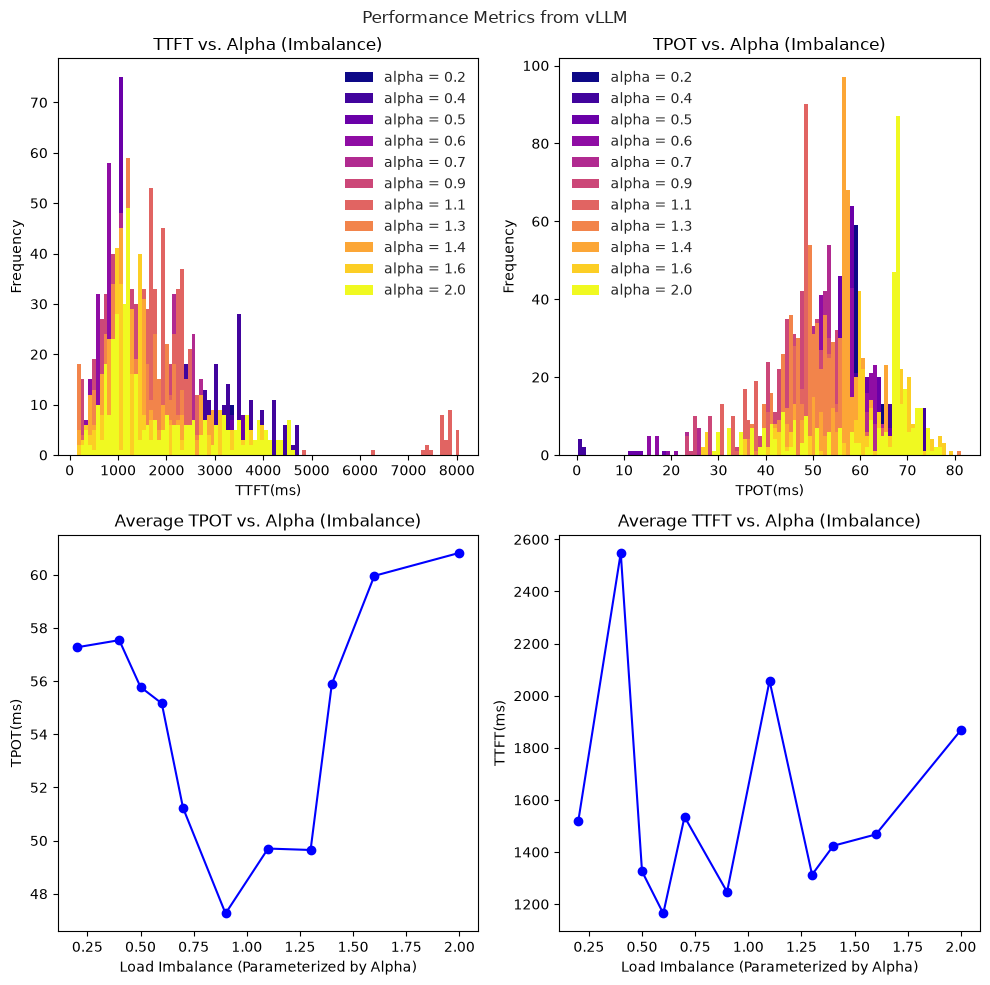

In [44]:
plot_result_metrics(workload_results)

In [45]:
# Save results
with open(results_file, 'wb') as file:
    pickle.dump(workload_results, file)